# 0. Préparation de l'environnement de travail

### Importation des librairies

In [173]:
import warnings

# Suppress the warning
warnings.simplefilter(action='ignore', category=FutureWarning)

In [174]:
import os
import re
import numpy as np
import pandas as pd 
# import polars as pl
from  matplotlib  import pyplot as plt
import time
# from ydata_profiling import ProfileReport

In [175]:
import importlib
import My_function_p4

In [176]:
start_time = time.time()

In [177]:
# pd.set_option('display.width', None)
pd.set_option('display.max_columns', None)

## Définition du répertoire de travail

In [178]:
os.chdir("C:/Users/guill/Documents/OpenClassrooms/Reborn/Projet 4/Last week")

## Importation des datasets

In [179]:
import pickle
with open("df.pkl", "rb") as f:
    df = pickle.load(f)

In [180]:
import pickle
with open("df_summed.pkl", "rb") as f:
    df_summed = pickle.load(f)

In [181]:
import pickle
with open("df_transformed.pkl", "rb") as f:
    df_transformed = pickle.load(f)

# 1. Les Modeles : Premier Test 

## 1.0 Préparation

### Correlation check :

#### df

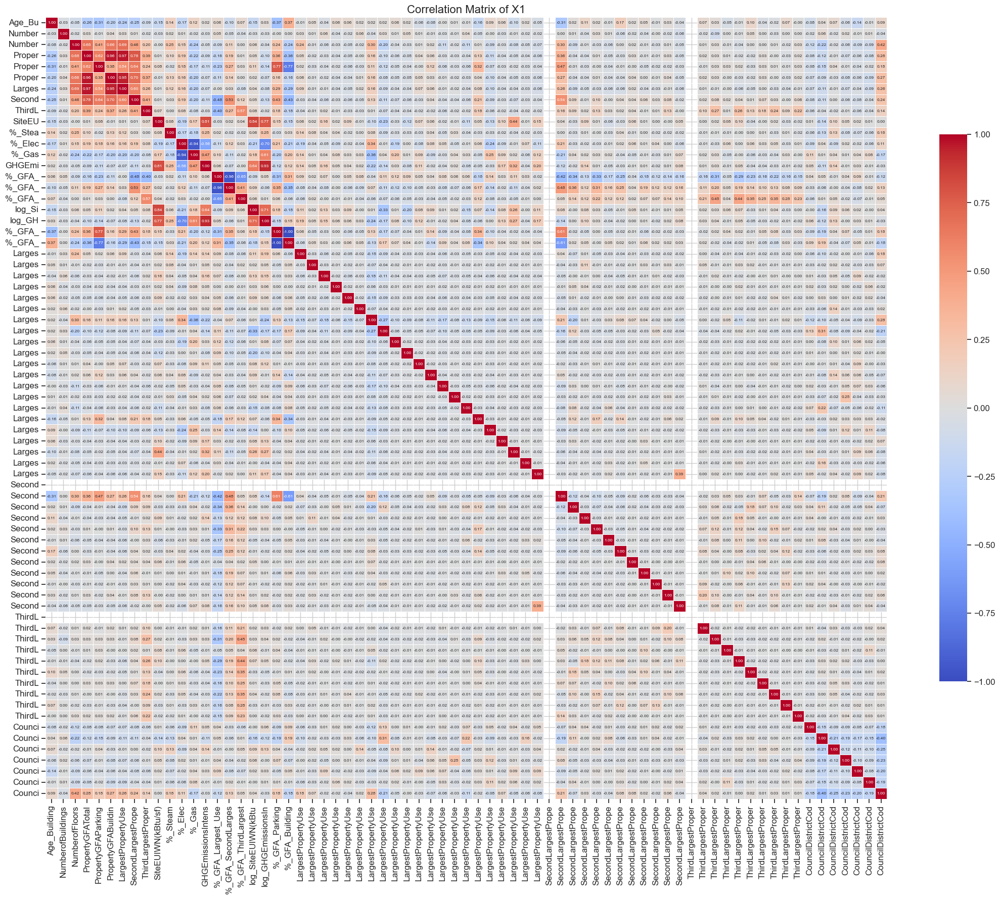

In [182]:
correlation_matrix = df.corr()
import matplotlib.pyplot as plt
import seaborn as sns

# Shorten column names for display
correlation_matrix.columns = [col[:18] for col in correlation_matrix.columns]
correlation_matrix.index = [idx[:6] for idx in correlation_matrix.index]

# Create the heatmap with larger cells
plt.figure(figsize=(22, 18))  # Increase figure size for bigger cells
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5,
            annot_kws={"size": 6},  # Increase annotation font size
            cbar_kws={'shrink': 0.7})   #Shrink the colorbar so annotations don't overlap
# Add a title
plt.title("Correlation Matrix of X1", fontsize=16)  #Increase title fontsize
# Adjust layout to prevent labels from overlapping
plt.tight_layout()
# Show the plot
plt.show()

#### df_summed

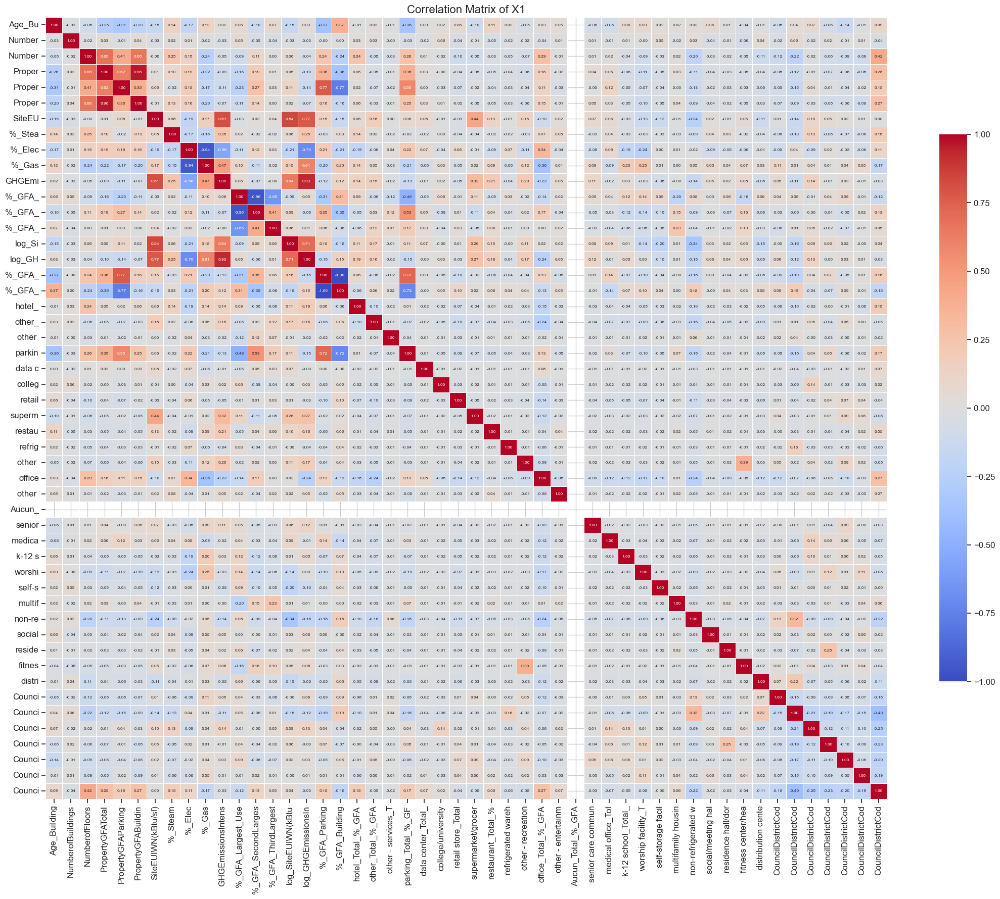

In [183]:
correlation_matrix = df_summed.corr()
import matplotlib.pyplot as plt
import seaborn as sns

# Shorten column names for display
correlation_matrix.columns = [col[:18] for col in correlation_matrix.columns]
correlation_matrix.index = [idx[:6] for idx in correlation_matrix.index]

# Create the heatmap with larger cells
plt.figure(figsize=(22, 18))  # Increase figure size for bigger cells
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5,
            annot_kws={"size": 6},  # Increase annotation font size
            cbar_kws={'shrink': 0.7})   #Shrink the colorbar so annotations don't overlap
# Add a title
plt.title("Correlation Matrix of X1", fontsize=16)  #Increase title fontsize
# Adjust layout to prevent labels from overlapping
plt.tight_layout()
# Show the plot
plt.show()

#### df_transformed

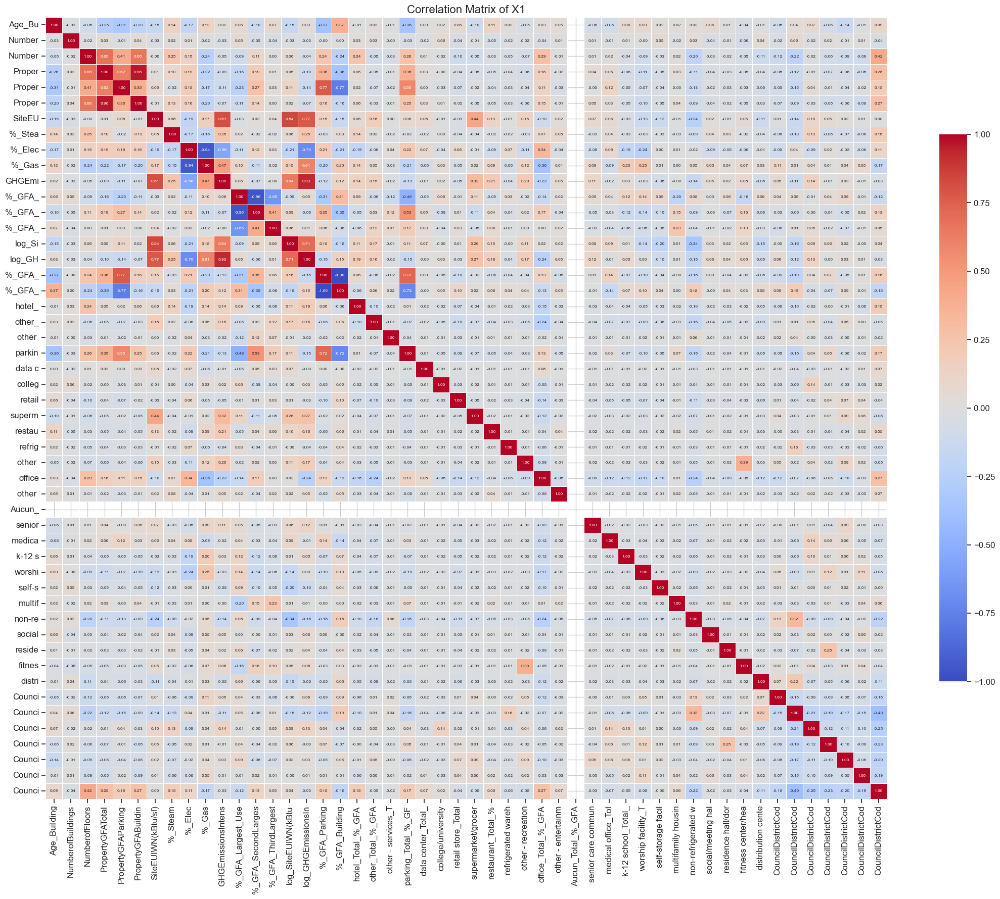

In [184]:
correlation_matrix = df_summed.corr()
import matplotlib.pyplot as plt
import seaborn as sns

# Shorten column names for display
correlation_matrix.columns = [col[:18] for col in correlation_matrix.columns]
correlation_matrix.index = [idx[:6] for idx in correlation_matrix.index]

# Create the heatmap with larger cells
plt.figure(figsize=(22, 18))  # Increase figure size for bigger cells
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5,
            annot_kws={"size": 6},  # Increase annotation font size
            cbar_kws={'shrink': 0.7})   #Shrink the colorbar so annotations don't overlap
# Add a title
plt.title("Correlation Matrix of X1", fontsize=16)  #Increase title fontsize
# Adjust layout to prevent labels from overlapping
plt.tight_layout()
# Show the plot
plt.show()

### Drop 

In [185]:
target_col = ["GHGEmissionsIntensity", "SiteEUIWN(kBtu/sf)"]

In [186]:
log_target_col = ["log_GHGEmissionsIntensity", "log_SiteEUIWN(kBtu/sf)"]

In [187]:
df_log = df

In [188]:
df_summed_log = df_summed

#### df

In [189]:
cor_col = ["LargestPropertyUseTypeGFA", "SecondLargestPropertyUseTypeGFA", "ThirdLargestPropertyUseTypeGFA", "%_GFA_Parking", "%_Elec","PropertyGFAParking", "PropertyGFABuilding(s)",
           "%_GFA_Largest_Use", "%_GFA_SecondLargest_Use", "%_GFA_ThirdLargest_Use", "%_GFA_Building"]

In [190]:
drop_col = log_target_col + cor_col
df = df.drop(columns=drop_col)

In [191]:
drop_col = target_col + cor_col
df_log = df_log.drop(columns=drop_col)

#### df_summed

In [192]:
cor_col_summed = ["%_GFA_Parking", "%_Elec","PropertyGFAParking", "PropertyGFABuilding(s)",
           "%_GFA_Largest_Use", "%_GFA_SecondLargest_Use", "%_GFA_ThirdLargest_Use", "%_GFA_Building"]

In [193]:
drop_col_summed = log_target_col + cor_col_summed
df_summed = df_summed.drop(columns=drop_col_summed)

In [194]:
drop_col_summed = target_col + cor_col_summed
df_summed_log = df_summed_log.drop(columns=drop_col_summed)

#### df_transformed

In [195]:
drop_col_transf = log_target_col + cor_col_summed
df_transformed = df_transformed.drop(columns=drop_col_transf)

### Type

In [196]:
from My_function_p4 import type_definition

In [197]:
num_col, cat_col = type_definition(df)
df = df[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'SiteEUIWN(kBtu/sf)', '%_Steam', '%_Gas', 'GHGEmissionsIntensity', 'LargestPropertyUseType_hotel_%_GFA', 'LargestPropertyUseType_other - entertainment/public assembly_%_GFA', 'LargestPropertyUseType_other_grouped_%_GFA', 'LargestPropertyUseType_social/meeting hall_%_GFA', 'LargestPropertyUseType_other_%_GFA', 'LargestPropertyUseType_college/university_%_GFA', 'LargestPropertyUseType_office_%_GFA', 'LargestPropertyUseType_non-refrigerated warehouse_%_GFA', 'LargestPropertyUseType_k-12 school_%_GFA', 'LargestPropertyUseType_self-storage facility_%_GFA', 'LargestPropertyUseType_senior care community_%_GFA', 'LargestPropertyUseType_medical office_%_GFA', 'LargestPropertyUseType_retail store_%_GFA', 'LargestPropertyUseType_residence hall/dormitory_%_GFA', 'LargestPropertyUseType_distribution center_%_GFA', 'LargestPropertyUseType_parking_%_GFA', 'LargestPropertyUseType_worship facility_%_GFA', 

In [198]:
num_col, cat_col = type_definition(df_summed)
df_summed = df_summed[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'SiteEUIWN(kBtu/sf)', '%_Steam', '%_Gas', 'GHGEmissionsIntensity', 'hotel_Total_%_GFA', 'other_Total_%_GFA', 'other - services_Total_%_GFA', 'parking_Total_%_GFA', 'data center_Total_%_GFA', 'college/university_Total_%_GFA', 'retail store_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA', 'restaurant_Total_%_GFA', 'refrigerated warehouse_Total_%_GFA', 'other - recreation_Total_%_GFA', 'office_Total_%_GFA', 'other - entertainment/public assembly_Total_%_GFA', 'Aucun_Total_%_GFA', 'senior care community_Total_%_GFA', 'medical office_Total_%_GFA', 'k-12 school_Total_%_GFA', 'worship facility_Total_%_GFA', 'self-storage facility_Total_%_GFA', 'multifamily housing_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'social/meeting hall_Total_%_GFA', 'residence hall/dormitory_Total_%_GFA', 'fitness center/health club/gym_Total_%_GFA', 'distribution center_Total_%_GFA', 'CouncilDistrictCo

In [199]:
num_col, cat_col = type_definition(df_summed_log)
df_summed_log = df_summed_log[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', '%_Steam', '%_Gas', 'log_SiteEUIWN(kBtu/sf)', 'log_GHGEmissionsIntensity', 'hotel_Total_%_GFA', 'other_Total_%_GFA', 'other - services_Total_%_GFA', 'parking_Total_%_GFA', 'data center_Total_%_GFA', 'college/university_Total_%_GFA', 'retail store_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA', 'restaurant_Total_%_GFA', 'refrigerated warehouse_Total_%_GFA', 'other - recreation_Total_%_GFA', 'office_Total_%_GFA', 'other - entertainment/public assembly_Total_%_GFA', 'Aucun_Total_%_GFA', 'senior care community_Total_%_GFA', 'medical office_Total_%_GFA', 'k-12 school_Total_%_GFA', 'worship facility_Total_%_GFA', 'self-storage facility_Total_%_GFA', 'multifamily housing_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'social/meeting hall_Total_%_GFA', 'residence hall/dormitory_Total_%_GFA', 'fitness center/health club/gym_Total_%_GFA', 'distribution center_Total_%_GFA', 'CouncilDi

In [200]:
num_col, cat_col = type_definition(df_log)
df_log = df_log[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', '%_Steam', '%_Gas', 'log_SiteEUIWN(kBtu/sf)', 'log_GHGEmissionsIntensity', 'LargestPropertyUseType_hotel_%_GFA', 'LargestPropertyUseType_other - entertainment/public assembly_%_GFA', 'LargestPropertyUseType_other_grouped_%_GFA', 'LargestPropertyUseType_social/meeting hall_%_GFA', 'LargestPropertyUseType_other_%_GFA', 'LargestPropertyUseType_college/university_%_GFA', 'LargestPropertyUseType_office_%_GFA', 'LargestPropertyUseType_non-refrigerated warehouse_%_GFA', 'LargestPropertyUseType_k-12 school_%_GFA', 'LargestPropertyUseType_self-storage facility_%_GFA', 'LargestPropertyUseType_senior care community_%_GFA', 'LargestPropertyUseType_medical office_%_GFA', 'LargestPropertyUseType_retail store_%_GFA', 'LargestPropertyUseType_residence hall/dormitory_%_GFA', 'LargestPropertyUseType_distribution center_%_GFA', 'LargestPropertyUseType_parking_%_GFA', 'LargestPropertyUseType_worship facility_

In [201]:
num_col, cat_col = type_definition(df_transformed)
df_transformed = df_transformed[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'SiteEUIWN(kBtu/sf)', '%_Steam', '%_Gas', 'GHGEmissionsIntensity', 'hotel_Total_%_GFA', 'other_Total_%_GFA', 'other - services_Total_%_GFA', 'parking_Total_%_GFA', 'data center_Total_%_GFA', 'college/university_Total_%_GFA', 'retail store_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA', 'restaurant_Total_%_GFA', 'refrigerated warehouse_Total_%_GFA', 'other - recreation_Total_%_GFA', 'office_Total_%_GFA', 'other - entertainment/public assembly_Total_%_GFA', 'Aucun_Total_%_GFA', 'senior care community_Total_%_GFA', 'medical office_Total_%_GFA', 'k-12 school_Total_%_GFA', 'worship facility_Total_%_GFA', 'self-storage facility_Total_%_GFA', 'multifamily housing_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'social/meeting hall_Total_%_GFA', 'residence hall/dormitory_Total_%_GFA', 'fitness center/health club/gym_Total_%_GFA', 'distribution center_Total_%_GFA', 'CouncilDistrictCo

In [202]:
df_transformed[num_col] = df_transformed[num_col].fillna(df_transformed[num_col].median())

## 1.1. Les modèles : overview

Nous testons le résultat de différents modèles avec des hyperparamètre basiques sur nos données. Cela nous donne une idée de quels modèles approfondir.

Notes d'interprétation : <b> un standard scaler est appliqué pour l'ensemble des tests. </b>

### df

Sur la cible :

In [203]:
importlib.reload(My_function_p4)
from My_function_p4 import overview_models_target


df = df.drop(columns="SiteEUIWN(kBtu/sf)")
results_df_sorted = overview_models_target(df, "GHGEmissionsIntensity")


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model  R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0              CatBoost     0.5101       1.1712      0.6871        0.2311   
1               XGBoost     0.4848       1.2011      0.7047        0.0489   
2          RandomForest     0.4671       1.2216      0.6988        0.1893   
3      GradientBoosting     0.4627       1.2266      0.7090        0.2292   
4                 Ridge     0.4483       1.2429

### df_log

Sur la cible passée au log :

In [204]:
df_log[["log_GHGEmissionsIntensity"]].describe()

,log_GHGEmissionsIntensity
count,1352.000000
mean,0.734394
std,0.528420
min,0.009950
25%,0.300105
50%,0.609766
75%,1.058657
max,2.768832


In [205]:
importlib.reload(My_function_p4)
from My_function_p4 import overview_models_target

df_log = df_log.drop(columns='log_SiteEUIWN(kBtu/sf)')

results_df_sorted = overview_models_target(df_log, target ='log_GHGEmissionsIntensity')


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model  R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0              CatBoost     0.6070       0.3128      0.2237        0.2263   
1               XGBoost     0.6014       0.3150      0.2266        0.0489   
2      GradientBoosting     0.6012       0.3150      0.2262        0.2381   
3          RandomForest     0.6001       0.3155      0.2269        0.2061   
4              LightGBM     0.5695       0.3273

In [206]:
results_df_sorted.to_csv('df_models_overview_output_log_T2.csv', index=False)

La différence entre MAE et RMSE est plus faible que pour T1. Le modèle est globalement meilleur, il présente aussi moins d'outliers dans nos erreurs de prédictions. Nous continuons avec 2 modèles :

- Catboost => R2 0.6070 ; 
- Boost : un modèle de Gradient Boosting => XGBoost ou GradientBoosting

### df_summed

In [207]:
df[["GHGEmissionsIntensity"]].describe()

,GHGEmissionsIntensity
count,1352.000000
mean,1.456294
std,1.761442
min,0.010000
25%,0.350000
50%,0.840000
75%,1.882500
max,14.940000


In [208]:
df_summed = df_summed.drop(columns='SiteEUIWN(kBtu/sf)')

In [209]:
importlib.reload(My_function_p4)
from My_function_p4 import overview_models_target

results_df_sorted = overview_models_target(df_summed, target ='GHGEmissionsIntensity')


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model  R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0              CatBoost     0.5686       1.0991      0.6628        0.1878   
1          RandomForest     0.5666       1.1016      0.6674        0.1887   
2             SVR_poly2     0.5546       1.1168      0.6596        0.0929   
3      GradientBoosting     0.5462       1.1272      0.6798        0.2319   
4               XGBoost     0.5138       1.1668

### df_summed_log

In [210]:
df_summed_log = df_summed_log.drop(columns='log_SiteEUIWN(kBtu/sf)')

In [211]:
importlib.reload(My_function_p4)
from My_function_p4 import overview_models_target

results_df_summed_sorted = overview_models_target(df_summed_log,  target ='log_GHGEmissionsIntensity')


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model  R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0          RandomForest     0.6268       0.3048      0.2229        0.1965   
1              CatBoost     0.6151       0.3095      0.2237        0.1751   
2      GradientBoosting     0.6020       0.3148      0.2237        0.2271   
3               XGBoost     0.5910       0.3191      0.2270        0.0469   
4              LightGBM     0.5812       0.3229

In [212]:
results_df_summed_sorted.to_csv('df_summed_models_overview_output.csv', index=False)

### df_transformed

In [213]:
df_transformed = df_transformed.drop(columns='SiteEUIWN(kBtu/sf)')

In [214]:
importlib.reload(My_function_p4)
from My_function_p4 import overview_models_target

results_df_transformed_sorted = overview_models_target(df_transformed,  target ='GHGEmissionsIntensity')


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model   R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0          RandomForest      0.2271       1.4712      0.8737        0.1868   
1              CatBoost      0.1888       1.5071      0.8613        0.1606   
2            ElasticNet      0.1847       1.5110      0.9684        0.0013   
3      GradientBoosting      0.1801       1.5152      0.8503        0.2203   
4                 Lasso      0.1728       

On continue avec un randomforest

# 2. Première analyse

## 2.0. Intro

On continue vers l'analyse, avec le dataframe df_summed_log et l'algorithme des forêts aléatoires.

## 2.1. Analyse sur jeu complet


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 38)
Step 2: Preprocessing complete.
Step 3: RFE skipped (target_feature_ratio not in (0, 1) or <= 1 feature).

--- 4. Training Final RandomForestRegressor Model ---
  Using RandomForestRegressor with params: {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': 42}
Training with 1081 samples and 38 features.
Model training complete.
Step 4: Final model training complete.

--- 5. Evaluating Regressor Performance ---
  Evaluating on 38 final features.
Scores on train set:
  R²   : 0.8

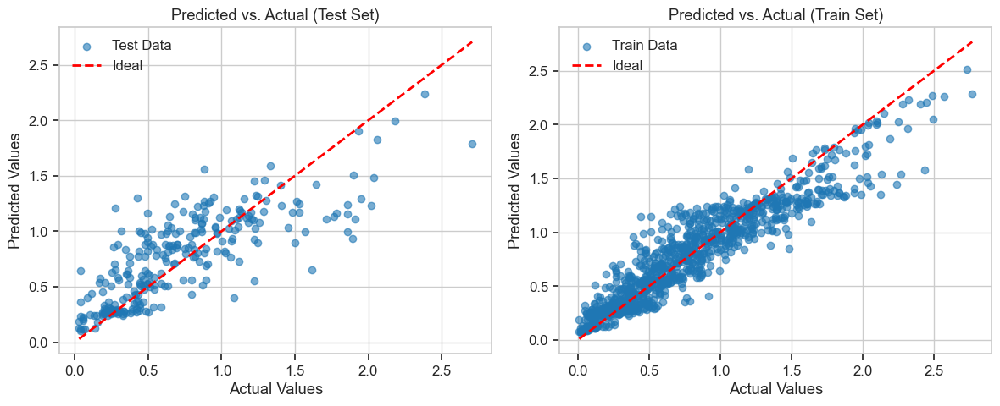

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 15 worst predictions ---
  Analyzing residuals based on 38 final features.
Residuals Summary: Min=-0.9278, Mean=-0.0460, Max=0.9656, Std=0.3017


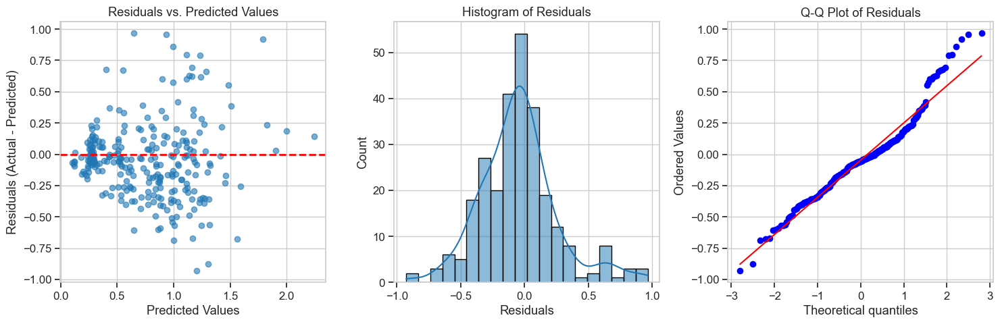


Detailing Top 15 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0             628       1.615420          0.649833  0.965587           0.965587                   1.615420
1            1283       1.893112          0.933279  0.959833           0.959833                   1.893112
2            2411       0.277632          1.205460 -0.927828           0.927828                   0.277632
3             426       2.706716          1.785151  0.921565           0.921565                   2.706716
4             768       0.425268          1.301395 -0.876127           0.876127                   0.425268
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 38 features used by the model.
Note: MDI Importance is for the features *after* pr

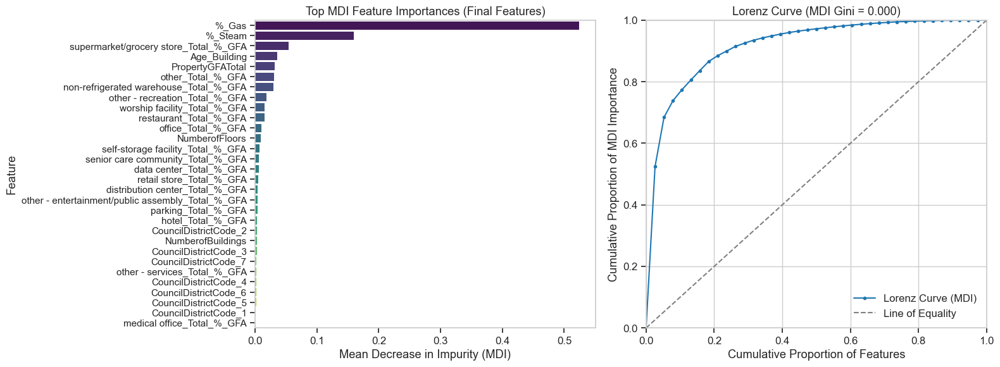

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 271 test samples and 38 features...
  SHAP Expected Value (Base): 0.7389

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                                 %_Gas       0.299866
                               %_Steam       0.068313
non-refrigerated warehouse_Total_%_GFA       0.041862
                     other_Total_%_GFA       0.032404
 supermarket/grocery store_Total_%_GFA       0.031733
                          Age_Building       0.019541
          worship facility_Total_%_GFA       0.016300
                      PropertyGFATotal       0.011102
                restaurant_Total_%_GFA       0.009131
        other - recreation_Total_%_GFA       0.007589

Generating SHAP summary plots...


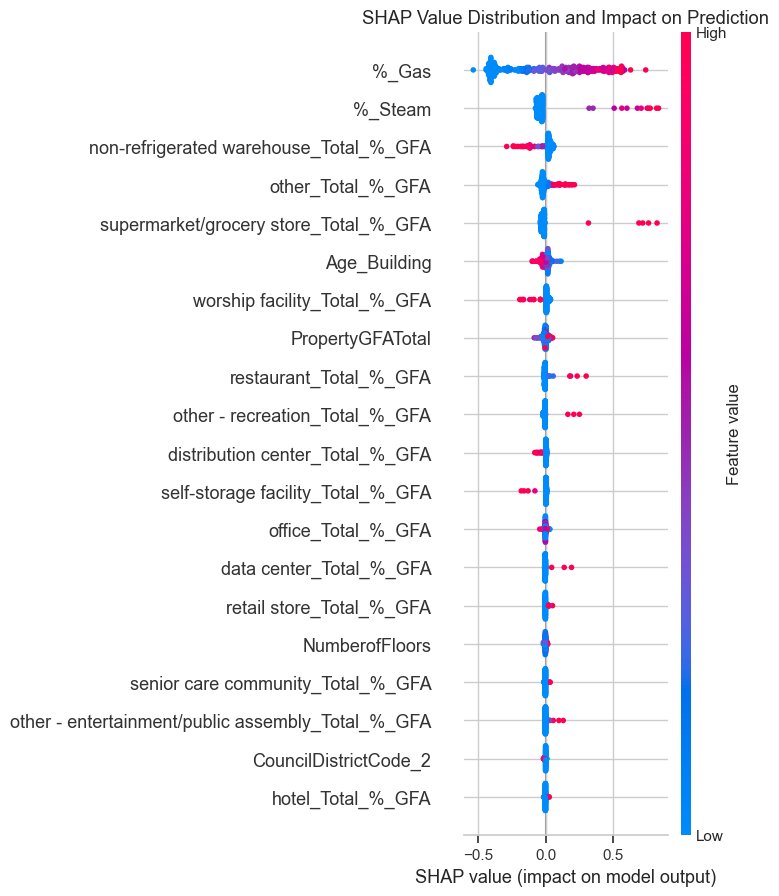


Generating SHAP dependence plots for top 5 features: ['%_Gas', '%_Steam', 'non-refrigerated warehouse_Total_%_GFA', 'other_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA']


<Figure size 640x480 with 0 Axes>

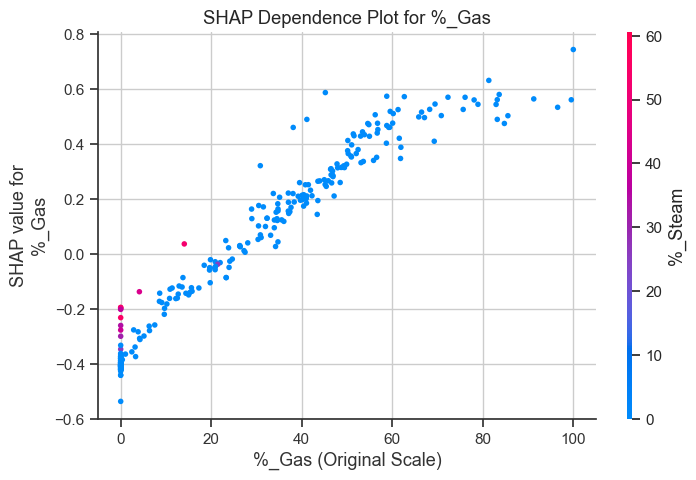

<Figure size 640x480 with 0 Axes>

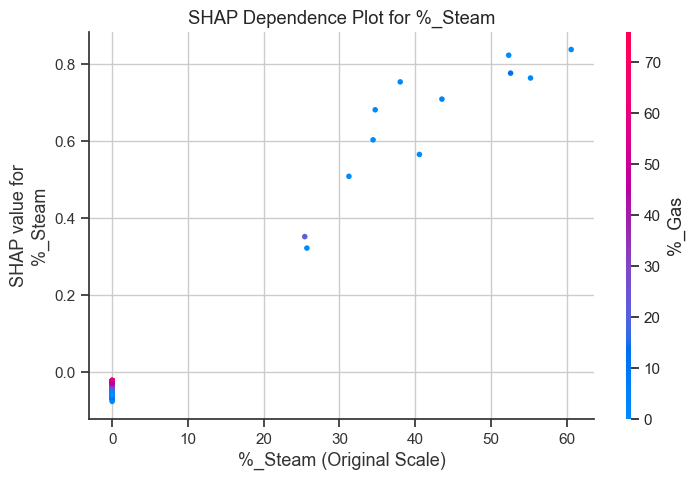

<Figure size 640x480 with 0 Axes>

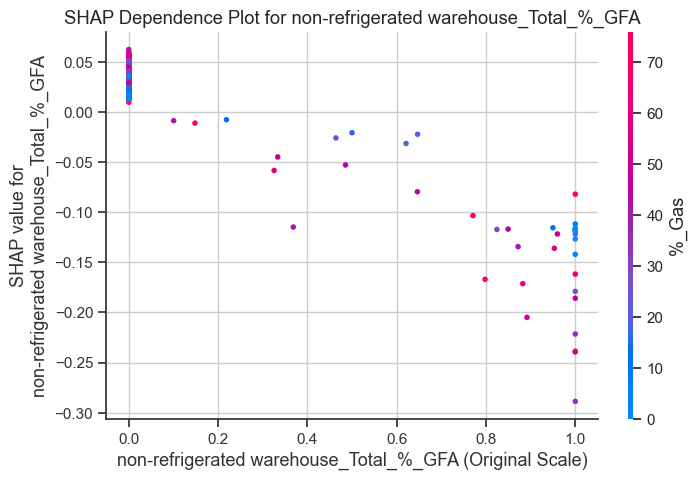

<Figure size 640x480 with 0 Axes>

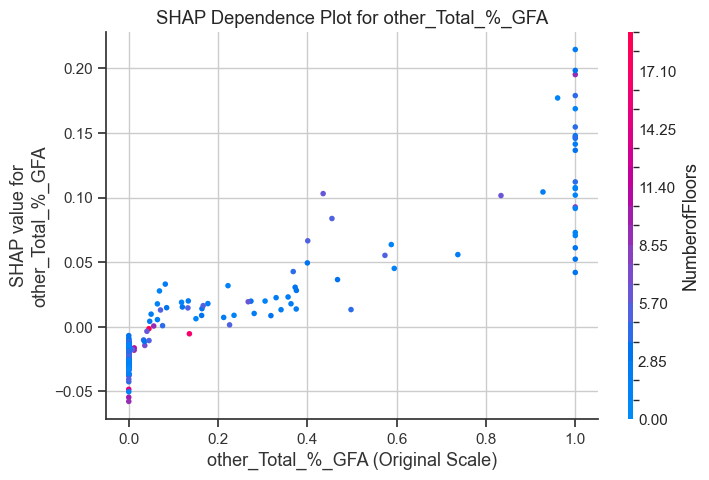

<Figure size 640x480 with 0 Axes>

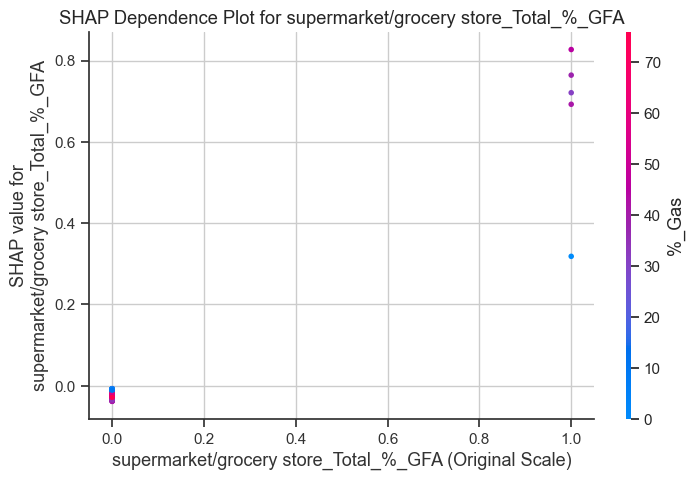

Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: T2_df_summed_log_FIRST_regression_analysis_results.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Info' sheet.
  - Preparing 'Metrics' sheet.
  - Saved 'Metrics' sheet.
  - 'importance_df' not found, empty, or not a DataFrame in results, skipping sheet.
  - Preparing 'SHAP Importance Summary' sheet.
  - Saved 'SHAP Importance Summary' sheet.
  - Preparing 'SHAP Values (Test Set)' sheet.
  - Saved 'SHAP Values (Test Set)' sheet.
  - Preparing 'Worst Residuals' sheet.
  - Saved 'Worst Residuals' sheet.
Successfully saved results to T2_df_summed_log_FIRST_regression_analysis_results.xlsx
Step 9: Results export attempt complete.

--- Full Regression Pipeline Finished in 5.33 seconds ---

--- Final Test Set Performance ---
  R²   : 0.6271
  MAE  : 0.2228
  MSE  : 0.0928
  RMSE : 0.3047


In [215]:
# --- Define Parameters ---
target_column = "log_GHGEmissionsIntensity"
scaler = 'None' # 'Standard', 'Robust', 'MinMax', 'None'
pca_components = None # None, integer, or float (0, 1]
rfe_ratio = 1 # Keep xx% of features after RFE (applied after PCA if used)
rf_model_params = {
    'n_estimators': 150,
    'max_depth': 10,
    # 'min_samples_leaf': 5,
    # 'min_samples_split': 10,
    'n_jobs': -1
    # 'random_state' is handled by the pipeline
}

excel_filename = "T2_df_summed_log_FIRST_regression_analysis_results.xlsx"
# --- Run Pipeline ---
analysis_results = My_function_p4.run_full_regression_pipeline(
    df=df_summed_log,
    target_col=target_column,
    scaler_type=scaler,
    pca_n_comp=pca_components,
    test_size=0.2,
    random_state=42,
    target_feature_ratio=rfe_ratio,
    n_worst_residuals=15,
    rf_params=rf_model_params,
    output_filename=excel_filename,
    run_shap_analysis=True, # Set to False to test skipping SHAP
    show_plots=True # Set to False to suppress plot windows
)

Performance : 
- 4 résidus au-delà de 0.9 en valeur absolue
- Le modèle garde une précision similaire quelle que soit la valeur
- Le modèle prédit sans retenir ni overfit : le train set n'a que 0.7 en R2.
- Avoir enlevé le scaling a légèrement augmenté le R2 du modèle de 3 dimillièmes.
- Une MAE de 0.22 correspond à une errreur d'un tier sur la valeur médiane 

Contenu :
- 20% de features permettent de garder +de 90% de l'importance de décisions. 
- la feature la plus importante est de 0.52, la seconde 0.16. 
- Le gaz et la vapeur constitue presque 70% de la décision.
- Le modèle prédit une valeur de base 0.7389, à laquelle on ajoutera en moyenne 0.29 dû à la variable gaz et 0.08 dû a steam,on enlevera 0.04 du à non-refrigerated, etc.

3 aspects intéressants à tester :
- supprimer autour de 60% de features avec une RFE pour comparer le résultat (chapitre 4)
- créer de nouvelles features basées sur les plus importantes : type importats, %gas, age, PropertyGFA. (chapitre 3)
- supprimer la feature %Gas, qui occupe une grande importance comparée à toutes les autres pour voir la réaction du modèle.

## 2.2. Analyse sans la Top feature

Commençons par regarder l'impact de la feature la plus importante sur la performance du modèle. On la retire :

In [216]:
df_minus1 = df_summed_log.drop(columns="%_Gas")

On relance l'analyse :


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 37, Using 37 numeric features.
Train set shape: X=(1081, 37), y=(1081,)
Test set shape: X=(271, 37), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 37)
Step 2: Preprocessing complete.
Step 3: RFE skipped (target_feature_ratio not in (0, 1) or <= 1 feature).

--- 4. Training Final RandomForestRegressor Model ---
  Using RandomForestRegressor with params: {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': 42}
Training with 1081 samples and 37 features.
Model training complete.
Step 4: Final model training complete.

--- 5. Evaluating Regressor Performance ---
  Evaluating on 37 final features.
Scores on train set:
  R²   : 0.6

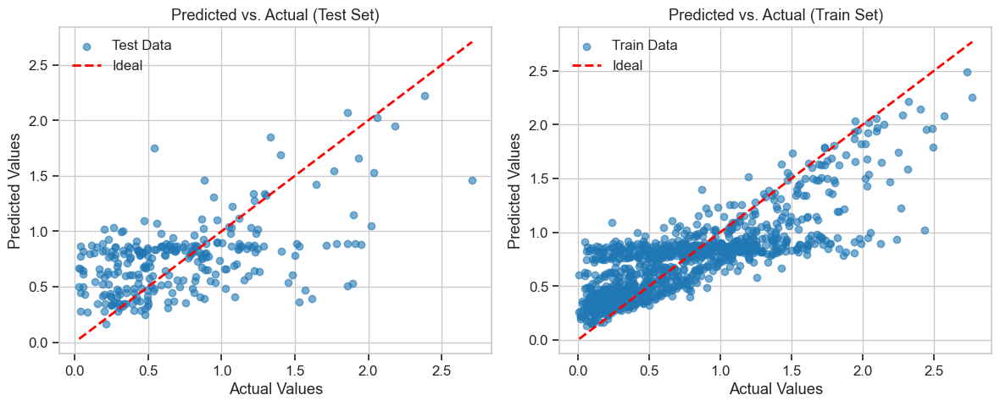

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 15 worst predictions ---
  Analyzing residuals based on 37 final features.
Residuals Summary: Min=-1.2092, Mean=-0.0358, Max=1.3597, Std=0.4227


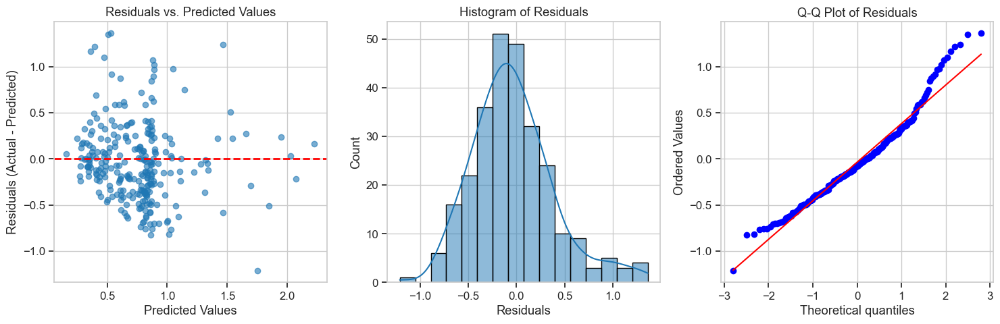


Detailing Top 15 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0            1283       1.893112          0.533392  1.359720           1.359720                   1.893112
1            3339       1.854734          0.509164  1.345570           1.345570                   1.854734
2             426       2.706716          1.464121  1.242595           1.242595                   2.706716
3             628       1.615420          0.396771  1.218649           1.218649                   1.615420
4             357       0.542324          1.751529 -1.209205           1.209205                   0.542324
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 37 features used by the model.
Note: MDI Importance is for the features *after* pr

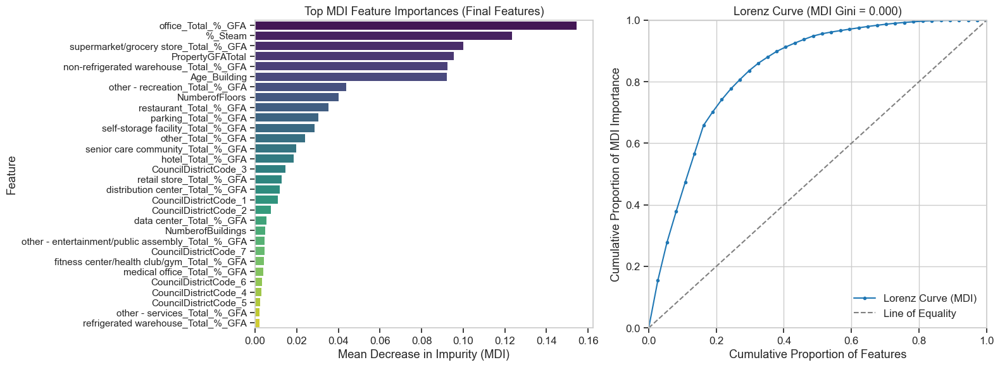

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 271 test samples and 37 features...
  SHAP Expected Value (Base): 0.7389

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                    office_Total_%_GFA       0.122572
non-refrigerated warehouse_Total_%_GFA       0.067351
                               %_Steam       0.054082
 supermarket/grocery store_Total_%_GFA       0.031431
                          Age_Building       0.029952
        other - recreation_Total_%_GFA       0.016482
                      PropertyGFATotal       0.016340
                   parking_Total_%_GFA       0.016314
                     other_Total_%_GFA       0.016300
                        NumberofFloors       0.015475

Generating SHAP summary plots...


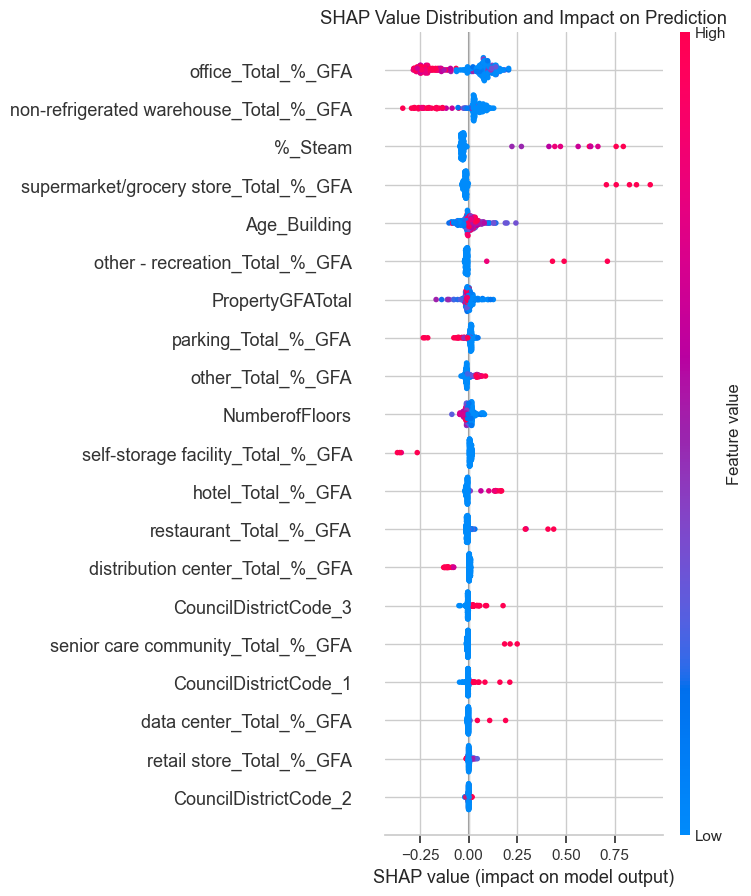


Generating SHAP dependence plots for top 5 features: ['office_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', '%_Steam', 'supermarket/grocery store_Total_%_GFA', 'Age_Building']


<Figure size 640x480 with 0 Axes>

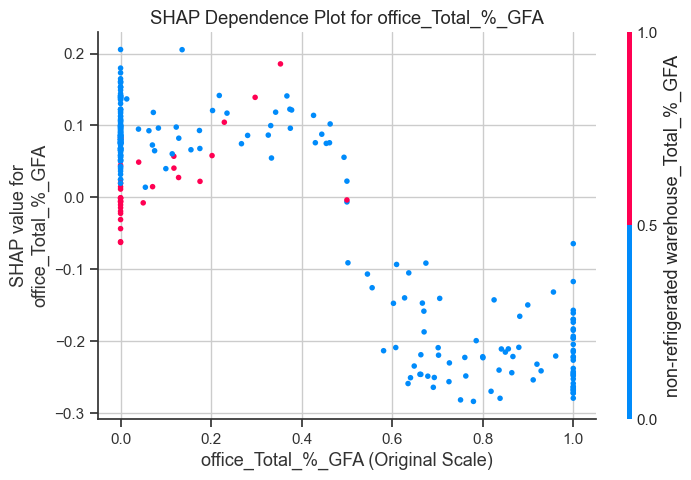

<Figure size 640x480 with 0 Axes>

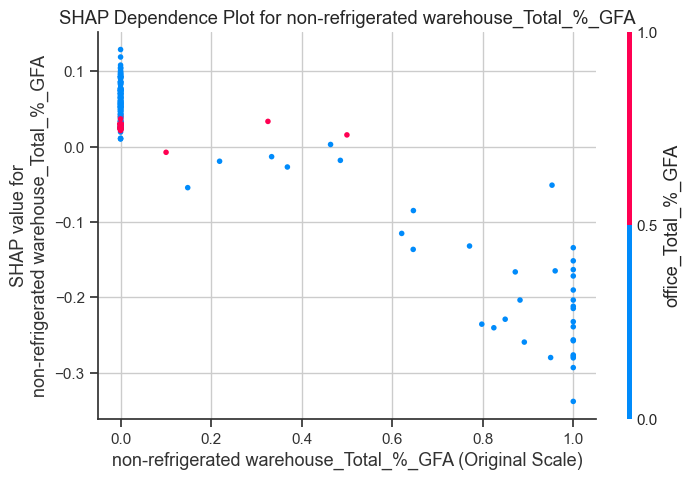

<Figure size 640x480 with 0 Axes>

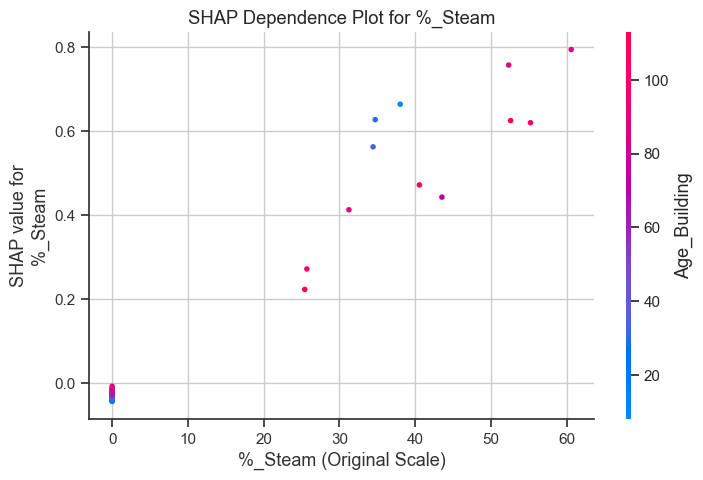

<Figure size 640x480 with 0 Axes>

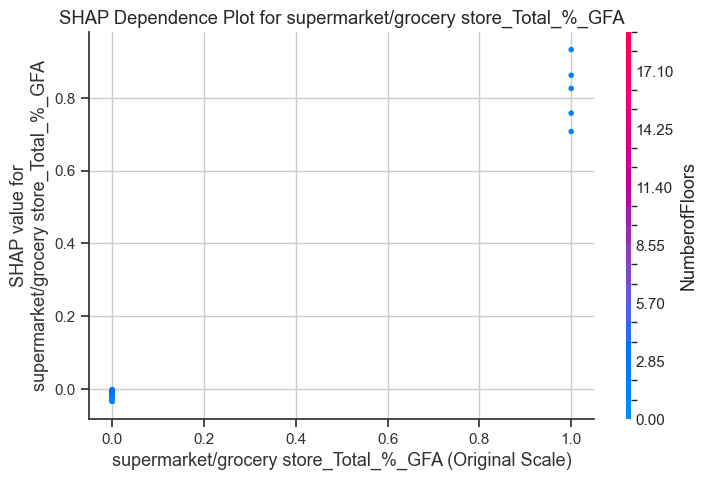

<Figure size 640x480 with 0 Axes>

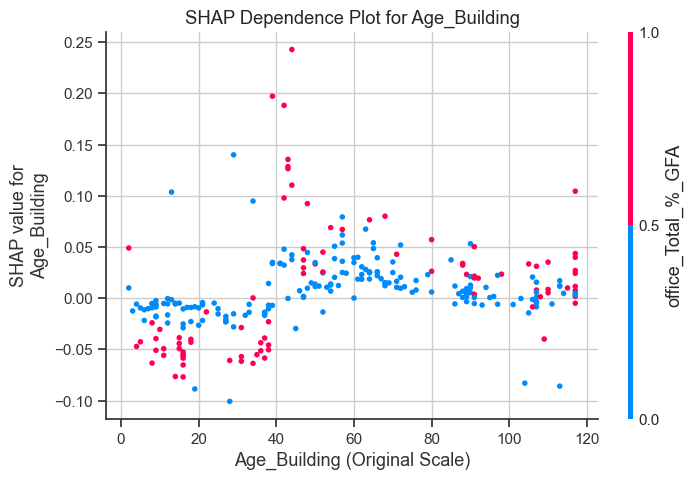

Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: T2_df_summed_log_minus1_regression_analysis_results.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Info' sheet.
  - Preparing 'Metrics' sheet.
  - Saved 'Metrics' sheet.
  - 'importance_df' not found, empty, or not a DataFrame in results, skipping sheet.
  - Preparing 'SHAP Importance Summary' sheet.
  - Saved 'SHAP Importance Summary' sheet.
  - Preparing 'SHAP Values (Test Set)' sheet.
  - Saved 'SHAP Values (Test Set)' sheet.
  - Preparing 'Worst Residuals' sheet.
  - Saved 'Worst Residuals' sheet.
Successfully saved results to T2_df_summed_log_minus1_regression_analysis_results.xlsx
Step 9: Results export attempt complete.

--- Full Regression Pipeline Finished in 4.89 seconds ---

--- Final Test Set Performance ---
  R²   : 0.2797
  MAE  : 0.3245
  MSE  : 0.1793
  RMSE : 0.4234


In [217]:
# --- Define Parameters ---
target_column = "log_GHGEmissionsIntensity"
scaler = 'None' # 'Standard', 'Robust', 'MinMax', 'None'
pca_components = None # None, integer, or float (0, 1]
rfe_ratio = 1 # Keep xx% of features after RFE (applied after PCA if used)
rf_model_params = {
    'n_estimators': 150,
    'max_depth': 10,
    # 'min_samples_leaf': 5,
    # 'min_samples_split': 10,
    'n_jobs': -1
    # 'random_state' is handled by the pipeline
}

excel_filename = "T2_df_summed_log_minus1_regression_analysis_results.xlsx"
# --- Run Pipeline ---
analysis_results = My_function_p4.run_full_regression_pipeline(
    df=df_minus1,
    target_col=target_column,
    scaler_type=scaler,
    pca_n_comp=pca_components,
    test_size=0.2,
    random_state=42,
    target_feature_ratio=rfe_ratio,
    n_worst_residuals=15,
    rf_params=rf_model_params,
    output_filename=excel_filename,
    run_shap_analysis=True, # Set to False to test skipping SHAP
    show_plots=True # Set to False to suppress plot windows
)

Avec les mêmes paramètres, les prédictions du modèle sont plus mauvaises. Le R2 a baissé de près de 0.4 et les autres métriques sont toutes plus élevées. 
Le gaz est très important pour la qualité des prédictions de la forêt aléatoire.
A noter : la stratégie de décision a changé. Office n'avait pas d'influences sur le précédent modèle et ici, c'est la plus grande valeur moyenne SHAP.

Nous allons créer quelques nouvelles features dans la partie Data-centric. Nous verrons la différence avec et sans celles-ci sur la performance du modèle. 

# 3. Amélioration Data Centric

## 3.0. Intro

Nous allons tester différents scaling et ACP afin de comparer les performances du modèle selon ces changements. 

## 3.1. ACP & Scaling

### 3.1.0. df_summed_log

In [218]:
# Reload the module
importlib.reload(My_function_p4)

# Import the functions
from My_function_p4 import check_data, split_data, run_experiments, process_and_display_results, main_pca_scale

# Configuration
TARGET_COLUMN = "log_GHGEmissionsIntensity"
TEST_SIZE = 0.2
RANDOM_STATE = 42
N_TOP_RESULTS_TO_SHOW = 10
OUTPUT_FILE = 'T2_ACP_scaling_model_performance_df_full_comparison.xlsx'

# RandomForest hyperparameters
rf_params = {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': RANDOM_STATE}

# Call the main function with the DataFrame and other parameters
main_pca_scale(df_summed_log, acp_min=2, target=TARGET_COLUMN, test_size=TEST_SIZE, random_state=RANDOM_STATE, output_file=OUTPUT_FILE, rf_params=rf_params, N_TOP_RESULTS_TO_SHOW=N_TOP_RESULTS_TO_SHOW)

--- Starting main_pca_scale process ---
Step 1: Checking data...
Data checks passed.

Step 2: Splitting data...

--- Splitting Data (Test Size: 0.2, Random State: 42) ---
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Data splitting complete.

Step 3: Defining experiment parameters...
Scalers to test: ['None', 'Standard', 'Robust', 'MinMax(1-100)']
PCA components to test (including None): [None, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
Experiment parameters defined.

Step 4: Running experiments...

--- Starting Experiments ---

Testing Scaler: None
  Scaler: None, PCA: None - Completed - R2: 0.6271, RMSE: 0.3047
  Scaler: None, PCA: 2 - PCA applied. New feature shape: (1081, 2)
  Scaler: None, PCA: 2 - Completed - R2: -0.0364, RMSE: 0.5079
  Scaler: None, PCA: 3 - PCA applied. New feature shape: (1081, 3)
  Scaler: None, PCA: 3 - Completed - R2: 0.2087, RMS

Ce qu'il faut retenir :

- le scaling a très peu d'effet sur la performance du modèle
- aucune ACP ne permet d'augmenter les performances

Rien d'étonnant pour un modèle de forêts aléatoires.

## 3.2. Feature engineering

### 3.2.0. Ajout de features

In [219]:
df_Feng = df_summed_log.copy()

In [220]:
import numpy as np

In [221]:
print(df_Feng.shape)

# add product features.
df_Feng["Gas_Dot_Supermarket"] = df_Feng["%_Gas"] * df_Feng["supermarket/grocery store_Total_%_GFA"]
df_Feng["Age_Dot_Office"] = df_Feng["Age_Building"] * df_Feng["office_Total_%_GFA"]
df_Feng["Age_Dot_nonrefrig_ware"] = df_Feng["Age_Building"] * df_Feng["non-refrigerated warehouse_Total_%_GFA"]
df_Feng["Gas_Dot_Age"] = df_Feng["%_Gas"] * df_Feng["Age_Building"]
df_Feng["PropertyGFATotal_Dot_Gas"] = df_Feng["PropertyGFATotal"] * df_Feng["%_Gas"]
df_Feng["PropertyGFATotal_Dot_Age"] = df_Feng["PropertyGFATotal"] * df_Feng["Age_Building"]
df_Feng["Gas_Dot_Inverse_Age"] = df_Feng["%_Gas"] * (1/df_Feng["Age_Building"])

# add powered features.
df_Feng["Squared_Age"] = df_Feng["Age_Building"] **2
df_Feng["Sqrt_Nb_floor"] = df_Feng["NumberofFloors"]**0.5
df_Feng["Squared_%_Gas"] = df_Feng["%_Gas"]**2
df_Feng["Sqrt_PropertyGFATotal"] = df_Feng["PropertyGFATotal"]**0.5

# add polynomial features.
df_Feng["Poly_Gas_NbFloor"] = pow((df_Feng["%_Gas"] + df_Feng["NumberofFloors"]),2)
df_Feng["Poly_Gas_Age"] = pow((df_Feng["%_Gas"] + df_Feng["Age_Building"]),2)

# add transformed features.
df_Feng["Inverse_Nb_floor"] = 1/(df_Feng["NumberofFloors"]+1)
df_Feng["Inverse_Age"] = 1/df_Feng["Age_Building"]
df_Feng["Log2_GFA"] = np.log2(df_Feng["PropertyGFATotal"])
df_Feng["Log_1p_Gas"] = np.log1p(df_Feng["%_Gas"]) 

# Add custom feat eng.
df_Feng["Inverse_Age_Dot_Log2_GFA"] = (1/df_Feng["Age_Building"]) * np.log2(df_Feng["PropertyGFATotal"])
df_Feng["Gas_Dot_Log2_GFA"] = (1/(df_Feng["%_Gas"]+1)) * np.log2(df_Feng["PropertyGFATotal"])
df_Feng["sqrt_GFA_Dot_NbFloor"]= (df_Feng["PropertyGFATotal"]**0.5) * df_Feng["NumberofFloors"]

df_Feng["Custom_1"] = ((df_Feng["PropertyGFATotal"]**0.25) + df_Feng["NumberofFloors"]) * df_Feng["Age_Building"]


print(df_Feng.shape)

(1352, 39)
(1352, 60)


### 3.2.1. Test ACP et scaling post FE

In [222]:
# Reload the module
importlib.reload(My_function_p4)

# Import the functions
from My_function_p4 import check_data, split_data, run_experiments, process_and_display_results, main_pca_scale

# Configuration
TARGET_COLUMN = "log_GHGEmissionsIntensity"
TEST_SIZE = 0.2
RANDOM_STATE = 42
N_TOP_RESULTS_TO_SHOW = 10
OUTPUT_FILE = 'ACP_scaling_model_performance_df_Feng_full_comparison.xlsx'

# RandomForest hyperparameters
rf_params = {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': RANDOM_STATE}

# Call the main function with the DataFrame and other parameters
main_pca_scale(df=df_Feng, acp_min=2, target=TARGET_COLUMN, test_size=TEST_SIZE, random_state=RANDOM_STATE, output_file=OUTPUT_FILE, rf_params=rf_params, N_TOP_RESULTS_TO_SHOW=N_TOP_RESULTS_TO_SHOW)

--- Starting main_pca_scale process ---
Step 1: Checking data...
Data checks passed.

Step 2: Splitting data...

--- Splitting Data (Test Size: 0.2, Random State: 42) ---
Train set shape: X=(1081, 59), y=(1081,)
Test set shape: X=(271, 59), y=(271,)
Data splitting complete.

Step 3: Defining experiment parameters...
Scalers to test: ['None', 'Standard', 'Robust', 'MinMax(1-100)']
PCA components to test (including None): [None, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]
Experiment parameters defined.

Step 4: Running experiments...

--- Starting Experiments ---

Testing Scaler: None
  Scaler: None, PCA: None - Completed - R2: 0.6255, RMSE: 0.3053
  Scaler: None, PCA: 2 - PCA applied. New feature shape: (1081, 2)
  Scaler: None, PCA: 2 - Completed - R2: 0.0928, RMSE: 0.4752
  Scaler: None, PCA: 3 - PCA applied

Ce qu'il faut retenir :

- le feature engineering a baissé la qualité du modèle. 

=>  On garde le jeu de départ avec la cible en log.

## 3.3 Comparaison générale des modèles Post-FE

Les performances sont légèrement supérieures à celle de départ. Les features les plus importantes sont celles créées lors du feature engineering contenant la variable gaz. Celle ci était la plus importante avant le FE.

Voyons comment réagissent les autres modèles à cette modification du jeu de données 

In [223]:
results_df_summed__FE_sorted = overview_models_target(df_Feng,  target ='log_GHGEmissionsIntensity')


--- Starting Model Evaluation ---
Evaluating LinearRegression...
Evaluating Ridge...
Evaluating Lasso...
Evaluating ElasticNet...
Evaluating KNeighborsRegressor...
Evaluating SVR_linear...
Evaluating SVR_rbf...
Evaluating SVR_poly2...
Evaluating SVR_poly3...
Evaluating SVR_poly4...
Evaluating SVR_poly5...
Evaluating DecisionTree...
Evaluating RandomForest...
Evaluating AdaBoost...
Evaluating GradientBoosting...
Evaluating XGBoost...
Evaluating LightGBM...
Evaluating CatBoost...
--- Evaluation Complete ---

--- Model Performance Overview (Sorted by Test R2) ---
                  Model  R2 (Test)  RMSE (Test)  MAE (Test)  Fit Time (s)  \
0              CatBoost     0.6505       0.2949      0.2130        0.2484   
1      GradientBoosting     0.6399       0.2994      0.2178        0.6712   
2          RandomForest     0.6257       0.3052      0.2275        0.3232   
3               XGBoost     0.6134       0.3102      0.2251        0.0698   
4            SVR_linear     0.6057       0.3133

Pour le jeu enrichi du FE, il est préférable de continuer avec un Gradient Boosting pour optimiser les performances des prédictions.
Pour l'explicabilité, on misera sur le modèle de forêts aléatoires sur le jeu de données non enrichi. Les performances restent comparables.

# 4. Améliorations Model Centric

## 4.1. Random Forest Regressor

### 4.1.0. Recursive Feature Elimination

RFE - df_summed_log :

Le modèle réagit bien en gardant 45% de features :


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 38)
Step 2: Preprocessing complete.

--- 3. Performing Recursive Feature Elimination (RFE) ---
Initial number of features for RFE: 38
Target number of features to select: 17 (45%)
  Using RandomForestRegressor with params {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1} as RFE estimator (random_state=42).
Fitting RFE to select 17 features...
RFE fitting complete.
RFE complete. Selected 17 features.
Step 3: RFE selection applied successfully.
  Final features selected: 17
  Final data shapes: X

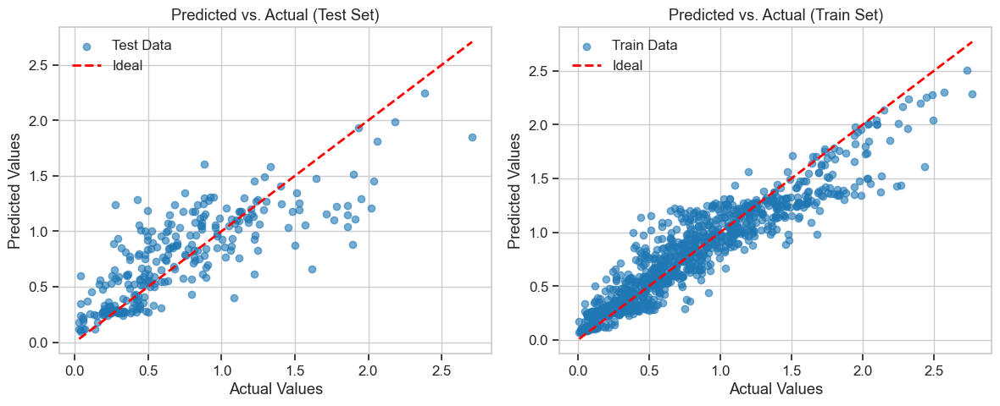

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 15 worst predictions ---
  Analyzing residuals based on 17 final features.
Residuals Summary: Min=-0.9637, Mean=-0.0473, Max=1.0097, Std=0.2996


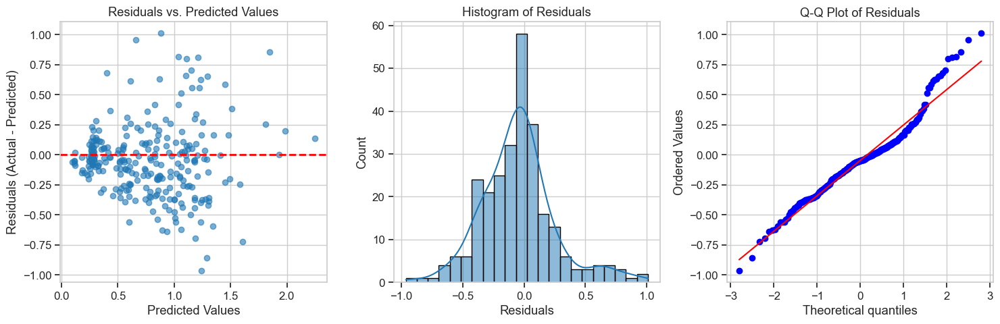


Detailing Top 15 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0            1283       1.893112          0.883365  1.009747           1.009747                   1.893112
1            2411       0.277632          1.241324 -0.963693           0.963693                   0.277632
2             628       1.615420          0.659187  0.956233           0.956233                   1.615420
3             768       0.425268          1.286355 -0.861088           0.861088                   0.425268
4             426       2.706716          1.849001  0.857715           0.857715                   2.706716
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 17 features used by the model.
Note: MDI Importance is for the features *after* pr

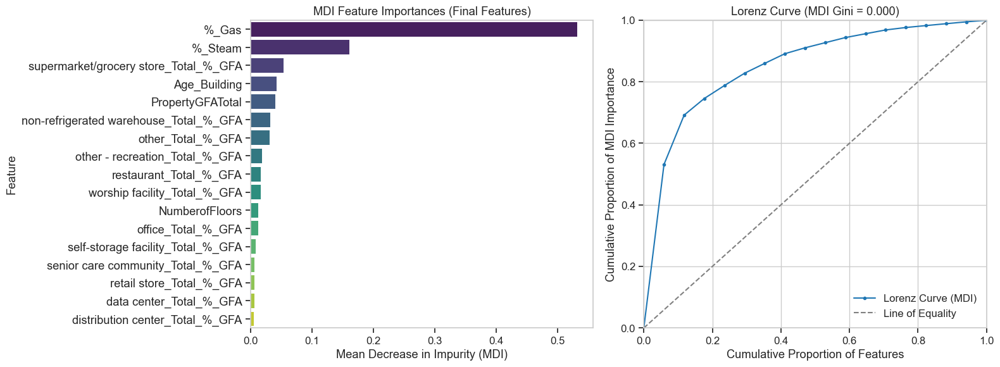

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 271 test samples and 17 features...
  SHAP Expected Value (Base): 0.7389

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                                 %_Gas       0.300759
                               %_Steam       0.068644
non-refrigerated warehouse_Total_%_GFA       0.044277
                     other_Total_%_GFA       0.031883
 supermarket/grocery store_Total_%_GFA       0.031448
                          Age_Building       0.023889
          worship facility_Total_%_GFA       0.018117
                      PropertyGFATotal       0.013197
                restaurant_Total_%_GFA       0.009940
        other - recreation_Total_%_GFA       0.007942

Generating SHAP summary plots...


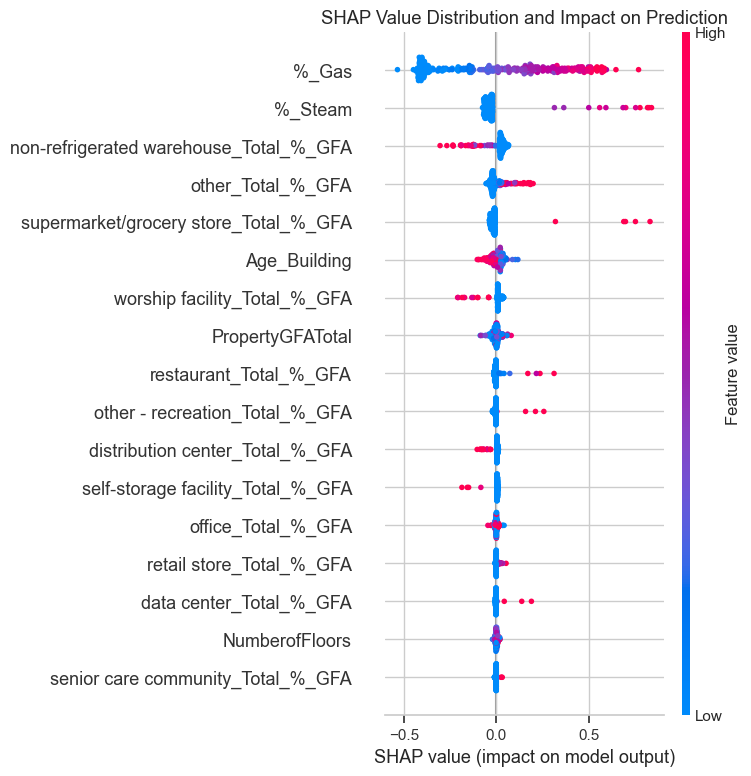


Generating SHAP dependence plots for top 5 features: ['%_Gas', '%_Steam', 'non-refrigerated warehouse_Total_%_GFA', 'other_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA']
  Could not generate dependence plot for '%_Gas': 'shap_values' must have the same number of columns as 'features'!
  Could not generate dependence plot for '%_Steam': 'shap_values' must have the same number of columns as 'features'!
  Could not generate dependence plot for 'non-refrigerated warehouse_Total_%_GFA': index 26 is out of bounds for axis 1 with size 17
  Could not generate dependence plot for 'other_Total_%_GFA': 'shap_values' must have the same number of columns as 'features'!
  Could not generate dependence plot for 'supermarket/grocery store_Total_%_GFA': 'shap_values' must have the same number of columns as 'features'!
Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: T2_df_summed_log_FIRST_regression_analysis_results.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Inf

<Figure size 640x480 with 0 Axes>

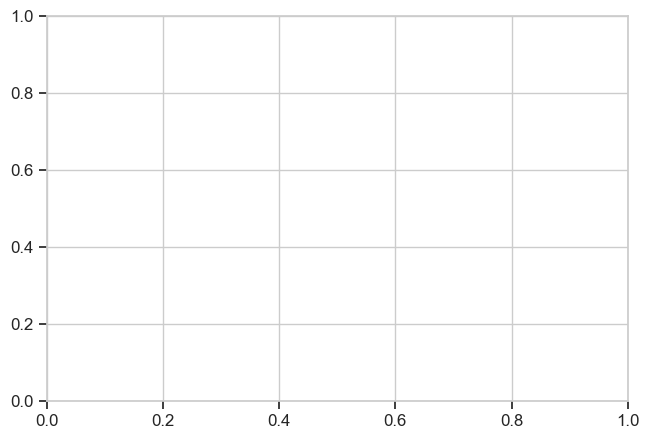

<Figure size 640x480 with 0 Axes>

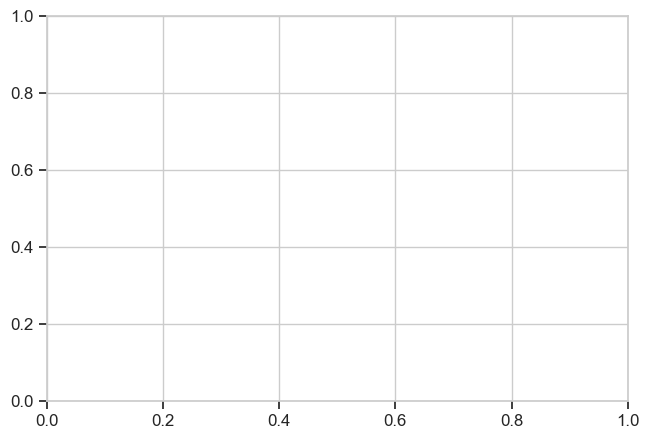

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

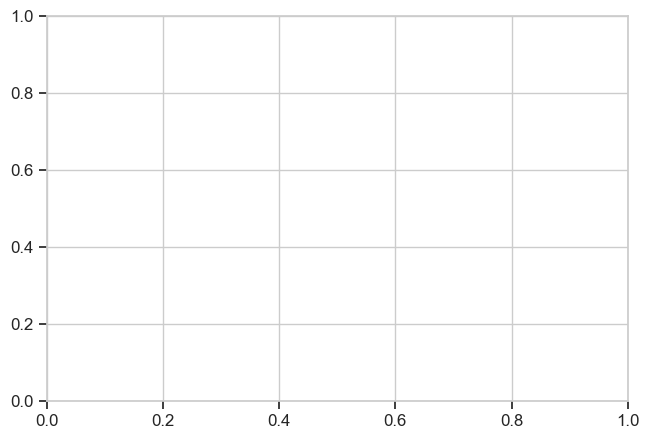

<Figure size 640x480 with 0 Axes>

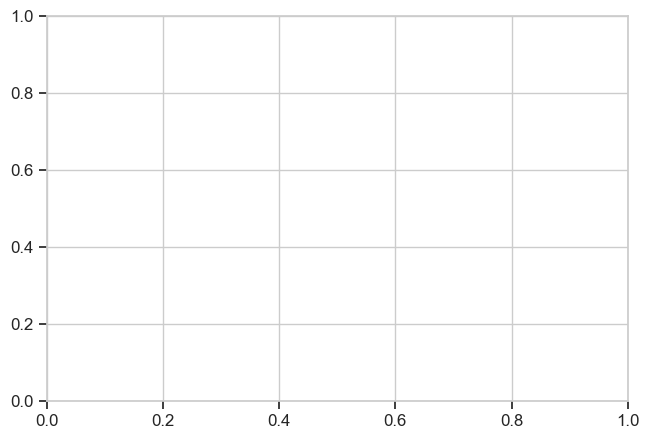

In [224]:
# --- Define Parameters ---
target_column = "log_GHGEmissionsIntensity"
scaler = 'None' # 'Standard', 'Robust', 'MinMax', 'None'
pca_components = None # None, integer, or float (0, 1]
rfe_ratio = 0.45 # Keep xx% of features after RFE (applied after PCA if used)
rf_model_params = {
    'n_estimators': 150,
    'max_depth': 10,
    # 'min_samples_leaf': 5,
    # 'min_samples_split': 10,
    'n_jobs': -1
    # 'random_state' is handled by the pipeline
}

excel_filename = "T2_df_summed_log_FIRST_regression_analysis_results.xlsx"
# --- Run Pipeline ---
analysis_results = My_function_p4.run_full_regression_pipeline(
    df=df_summed_log,
    target_col=target_column,
    scaler_type=scaler,
    pca_n_comp=pca_components,
    test_size=0.2,
    random_state=42,
    target_feature_ratio=rfe_ratio,
    n_worst_residuals=15,
    rf_params=rf_model_params,
    output_filename=excel_filename,
    run_shap_analysis=True, # Set to False to test skipping SHAP
    show_plots=True # Set to False to suppress plot windows
)

### 4.1.1. Random Search


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
Plot display disabled (show_plots=False). Plots might still be generated but not shown.
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  Applying Scaler: Robust
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 38)
Step 2: Preprocessing complete.

--- 3. Performing Recursive Feature Elimination (RFE) ---
Initial number of features for RFE: 38
Target number of features to select: 17 (45%)
  Using RandomForestRegressor with params {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1} as RFE estimator (random_state=42).
Fitting RFE to select 17 features...
RFE fitting complete.
RFE complete. Selected 17 features.
Step

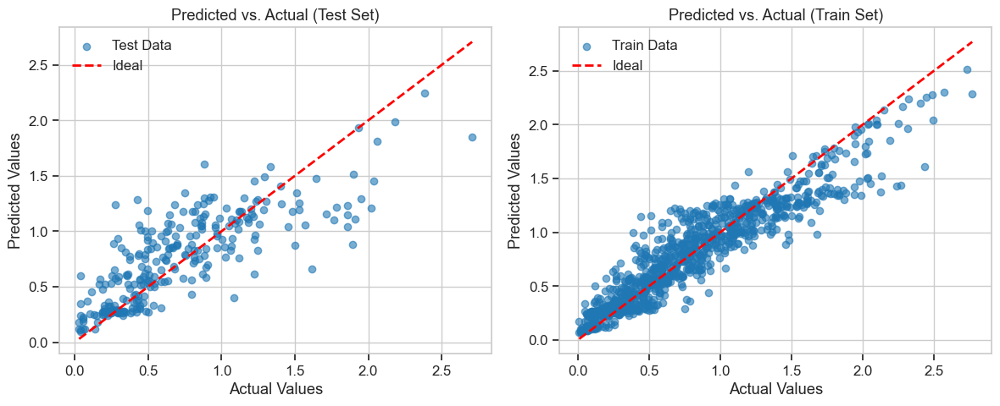

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 20 worst predictions ---
  Analyzing residuals based on 17 final features.
Residuals Summary: Min=-0.9650, Mean=-0.0473, Max=1.0097, Std=0.2997


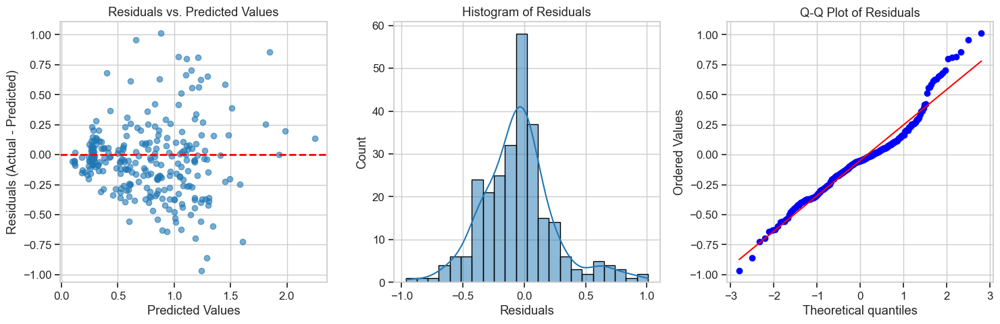


Detailing Top 20 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0            1283       1.893112          0.883365  1.009747           1.009747                   1.893112
1            2411       0.277632          1.242662 -0.965030           0.965030                   0.277632
2             628       1.615420          0.659187  0.956233           0.956233                   1.615420
3             768       0.425268          1.286355 -0.861088           0.861088                   0.425268
4             426       2.706716          1.849001  0.857715           0.857715                   2.706716
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 17 features used by the model.
Note: MDI Importance is for the features *after* pr

In [225]:
initial_pipeline_params = {
     'df' : df_summed_log,
     'target_col': 'log_GHGEmissionsIntensity',
     'scaler_type':'Robust',
     'pca_n_comp': None,
     'test_size': 0.2,
     'random_state':42,
     'target_feature_ratio':0.45, # RFE to keep 45% of features
     'n_worst_residuals':20,
     'rf_params':{'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1},
     'output_filename': 'T2_rf_pipeline_before_randomgrid_results.xlsx',
     'run_shap_analysis':False,
     'show_plots': False # Disable plots for the initial run
 }
initial_pipeline_results = My_function_p4.run_full_regression_pipeline(**initial_pipeline_params)


===== Starting Tuned RF Pipeline on Preprocessed Data =====
Random State used throughout tuning: 42
Step 1: Extracting data and transformations from previous pipeline results...
  Extracted initial processed data shapes: X_train=(1081, 38), X_test=(271, 38)
  RFE object found: Yes
  RFE mask found: Yes

Step 2: Applying RFE transformation to the data...
  Applying RFE transformation (selected 17 features) to data...
  Data shape after RFE transformation: X_train=(1081, 17), X_test=(271, 17)

Step 3: Starting Hyperparameter Tuning...

--- Starting Randomized Search (Directly on Processed Data) ---
   Input data shape: X_train=(1081, 17), X_test=(271, 17)
   (n_iter=100, cv=5, scoring='neg_root_mean_squared_error', random_state=42)
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Search finished in 26.39 seconds.

--- Best Tuning Results (CV on Train Data) ---
Best Score (neg_root_mean_squared_error): -0.2956
Best Parameters Found:
  max_depth: 15
  max_features: 0.5
  min

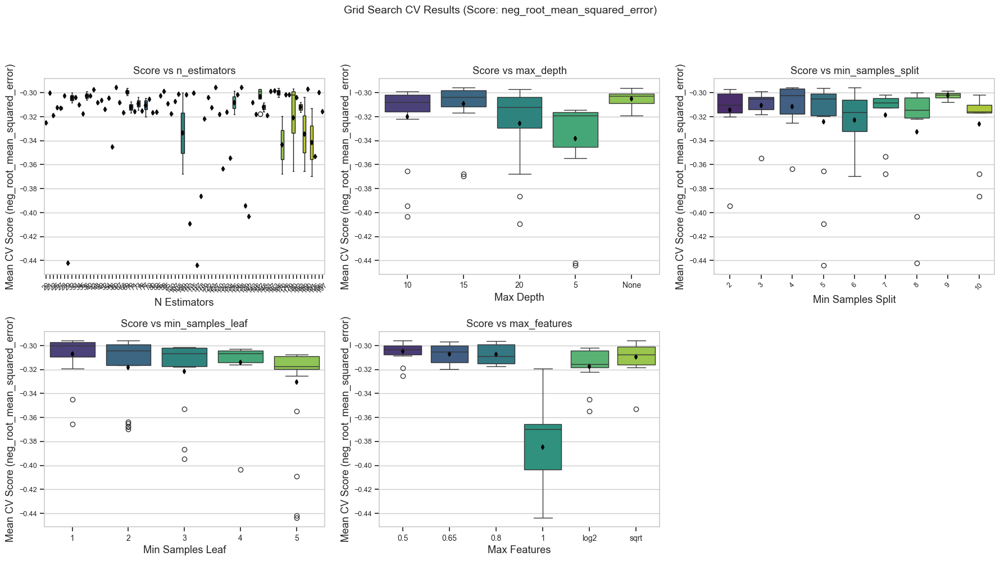


--- Saving Best Model/Pipeline ---
Best model/pipeline saved to: tuned_rf_output_from_pipeline\tuned_random_forest_model.joblib

--- Extracting Feature Importances (Tuned Model) ---

--- Extracting Feature Importances ---
  Using generic 'feature_importances_' attribute.
Feature importances saved to: tuned_rf_output_from_pipeline\tuned_feature_importances.csv
Top 15 Features:
                         Feature/Component  Importance
0                                    %_Gas    0.483448
1                                  %_Steam    0.120659
2    supermarket/grocery store_Total_%_GFA    0.057904
3                         PropertyGFATotal    0.052730
4                             Age_Building    0.052507
5                       office_Total_%_GFA    0.051058
6   non-refrigerated warehouse_Total_%_GFA    0.036835
7                        other_Total_%_GFA    0.032240
8                           NumberofFloors    0.028106
9           other - recreation_Total_%_GFA    0.018979
10             

In [226]:
from scipy.stats import uniform, randint

param_distributions_for_tuning = {
         'n_estimators': randint(20, 200),
         'max_depth': [5, 10, 15, 20, None],
         'min_samples_split': randint(2, 11),
         'min_samples_leaf': randint(1, 6),
         'max_features': ['sqrt', 'log2', 0.5, 0.65, 0.8, 1],
         # 'random_state' and 'n_jobs' are handled by the tuning function itself
         }

tuning_params = {
         'results_from_run_full_regression_pipeline': initial_pipeline_results,
         'param_distributions_config': param_distributions_for_tuning,
         'n_iter': 100,
         'cv_folds': 5,
         'scoring_metric': 'neg_root_mean_squared_error',
         'random_state': 42,
         'results_dir': 'tuned_rf_output_from_pipeline',
         'best_model_filename': 'tuned_random_forest_model.joblib',
         'save_importance': True,
         'top_n_features': 15,
         'show_plots': True # Enable plots for the tuning evaluation/importance
         }

tuned_model, tuned_test_scores = My_function_p4.orchestrate_tuned_rf_on_pipeline_output(**tuning_params)

Best Parameters Found:
  max_depth: 15
  max_features: 0.5
  min_samples_leaf: 2
  min_samples_split: 4
  n_estimators: 127

In [227]:
importlib.reload(My_function_p4)
import My_function_p4

### 4.1.2. Grid Search

--- Running Initial Pipeline to Get Processed Data for Grid Tuning ---

--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
Plot display disabled (show_plots=False). Plots might still be generated but not shown.
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  Applying Scaler: Robust
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 38)
Step 2: Preprocessing complete.

--- 3. Performing Recursive Feature Elimination (RFE) ---
Initial number of features for RFE: 38
Target number of features to select: 17 (45%)
  Using RandomForestRegressor with params {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1} as RFE estimator (random_state=42).
Fitting RFE to select 17 fea

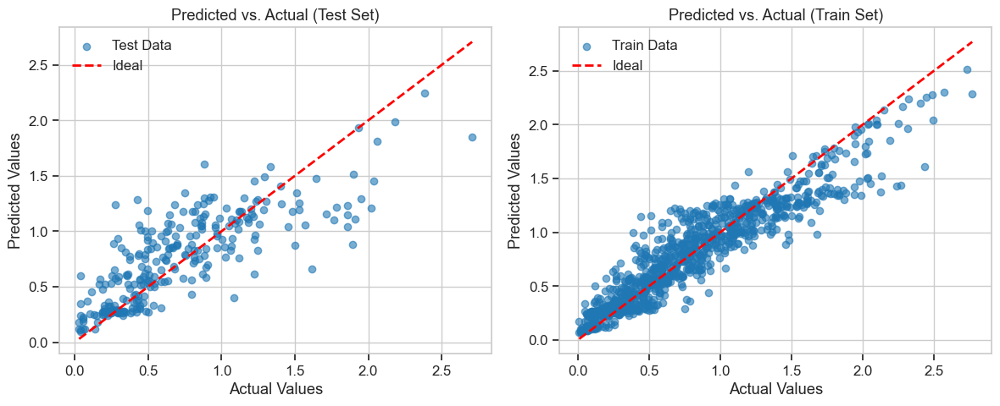

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 20 worst predictions ---
  Analyzing residuals based on 17 final features.
Residuals Summary: Min=-0.9650, Mean=-0.0473, Max=1.0097, Std=0.2997


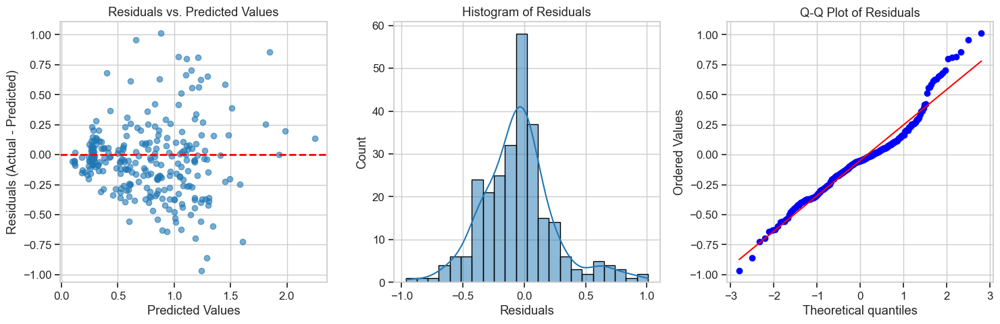


Detailing Top 20 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0            1283       1.893112          0.883365  1.009747           1.009747                   1.893112
1            2411       0.277632          1.242662 -0.965030           0.965030                   0.277632
2             628       1.615420          0.659187  0.956233           0.956233                   1.615420
3             768       0.425268          1.286355 -0.861088           0.861088                   0.425268
4             426       2.706716          1.849001  0.857715           0.857715                   2.706716
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 17 features used by the model.
Note: MDI Importance is for the features *after* pr

In [228]:
importlib.reload(My_function_p4)
import My_function_p4

# Step 1: Run the initial pipeline to determine the specific preprocessing and RFE
# Make sure this run uses your desired scaler, pca, and RFE ratio
print("--- Running Initial Pipeline to Get Processed Data for Grid Tuning ---")

initial_pipeline_params_for_grid = {
     'df' : df_summed_log,
     'target_col': 'log_GHGEmissionsIntensity',
     'scaler_type':'Robust',
     'pca_n_comp': None,
     'test_size': 0.2,
     'random_state':42,
     'target_feature_ratio':0.45, # RFE to keep 45% of features
     'n_worst_residuals':20,
     'rf_params':{'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1},
     'output_filename': 'T2_rf_pipeline_before_randomgrid_results.xlsx',
     'run_shap_analysis':False,
     'show_plots': False # Disable plots for the initial run
 }

# Make sure run_full_regression_pipeline is the updated version that stores data arrays
initial_pipeline_results_for_grid = My_function_p4.run_full_regression_pipeline(**initial_pipeline_params_for_grid)


===== Starting Grid Tuned RF Pipeline on Preprocessed Data =====
Random State used throughout tuning: 42
Step 1: Extracting data and transformations from previous pipeline results...
  Extracted initial processed data shapes: X_train=(1081, 38), X_test=(271, 38)
  RFE object found: Yes

Step 2: Applying RFE transformation to the data...
  Applying RFE transformation (selected 17 features) to data...
  Data shape after RFE transformation: X_train=(1081, 17), X_test=(271, 17)

Step 3: Starting Hyperparameter Tuning (GridSearchCV)...

--- Starting Grid Search (Directly on Processed Data) ---
   Input data shape: X_train=(1081, 17), X_test=(271, 17)
   Grid Size: 36 combinations
   (cv=5, scoring='neg_root_mean_squared_error', random_state=42)
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Search finished in 8.52 seconds.

--- Best Tuning Results (CV on Train Data) ---
Best Score (neg_root_mean_squared_error): -0.2921
Best Parameters Found:
  max_depth: 16
  max_features: 0

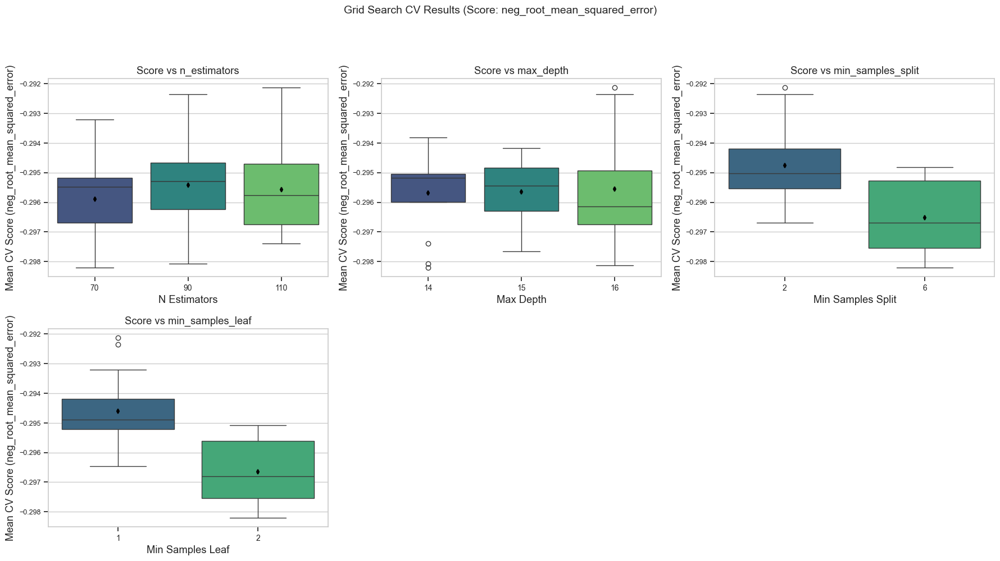


--- Saving Best Model/Pipeline ---
Best model/pipeline saved to: grid_tuned_rf_output_from_pipeline\grid_tuned_random_forest_model.joblib

--- Extracting Feature Importances (Tuned Model) ---

--- Extracting Feature Importances ---
  Using generic 'feature_importances_' attribute.
Feature importances saved to: grid_tuned_rf_output_from_pipeline\tuned_feature_importances.csv
Top 15 Features:
                         Feature/Component  Importance
0                                    %_Gas    0.467766
1                                  %_Steam    0.112882
2                         PropertyGFATotal    0.058914
3                             Age_Building    0.058307
4    supermarket/grocery store_Total_%_GFA    0.055896
5                       office_Total_%_GFA    0.052304
6   non-refrigerated warehouse_Total_%_GFA    0.035724
7                        other_Total_%_GFA    0.033015
8                           NumberofFloors    0.030925
9           other - recreation_Total_%_GFA    0.019016


In [229]:
param_grid_for_tuning = {
    'n_estimators': [70, 90, 110],      # Specific values to try for n_estimators
    'max_depth': [14, 15, 16],            # Specific values to try for max_depth
    'min_samples_split': [2, 6],     # Specific values
    'min_samples_leaf': [1, 2],           # Specific values
    'max_features': [0.5],      
    'random_state': [42],}


grid_tuning_params = {
    'results_from_run_full_regression_pipeline': initial_pipeline_results_for_grid,
    'param_grid_config': param_grid_for_tuning, # Use the grid here
    'cv_folds': 5,
    'scoring_metric': 'neg_root_mean_squared_error', # Use the same or preferred scoring
    'random_state': 42,
    'results_dir': "grid_tuned_rf_output_from_pipeline", # Output directory for grid results
    'best_model_filename': "grid_tuned_random_forest_model.joblib",
    'save_importance': True,
    'top_n_features': 15}

grid_tuned_model, grid_tuned_test_scores = My_function_p4.orchestrate_grid_tuned_rf_on_pipeline_output(**grid_tuning_params)
if grid_tuned_model:
    print("\nSuccessfully performed Grid Search tuning.")
    print(f"Best grid-tuned model test scores: {grid_tuned_test_scores}")
else:
    print("\nGrid tuning process failed.")

On réitère autour des Best Parameters Found:

  max_depth: 16
  max_features: 0.5
  min_samples_leaf: 1
  min_samples_split: 2
  n_estimators: 110
  random_state: 42


===== Starting Grid Tuned RF Pipeline on Preprocessed Data =====
Random State used throughout tuning: 42
Step 1: Extracting data and transformations from previous pipeline results...
  Extracted initial processed data shapes: X_train=(1081, 38), X_test=(271, 38)
  RFE object found: Yes

Step 2: Applying RFE transformation to the data...
  Applying RFE transformation (selected 17 features) to data...
  Data shape after RFE transformation: X_train=(1081, 17), X_test=(271, 17)

Step 3: Starting Hyperparameter Tuning (GridSearchCV)...

--- Starting Grid Search (Directly on Processed Data) ---
   Input data shape: X_train=(1081, 17), X_test=(271, 17)
   Grid Size: 6 combinations
   (cv=5, scoring='neg_root_mean_squared_error', random_state=42)
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Search finished in 2.55 seconds.

--- Best Tuning Results (CV on Train Data) ---
Best Score (neg_root_mean_squared_error): -0.2915
Best Parameters Found:
  max_depth: 16
  max_features: 0.5


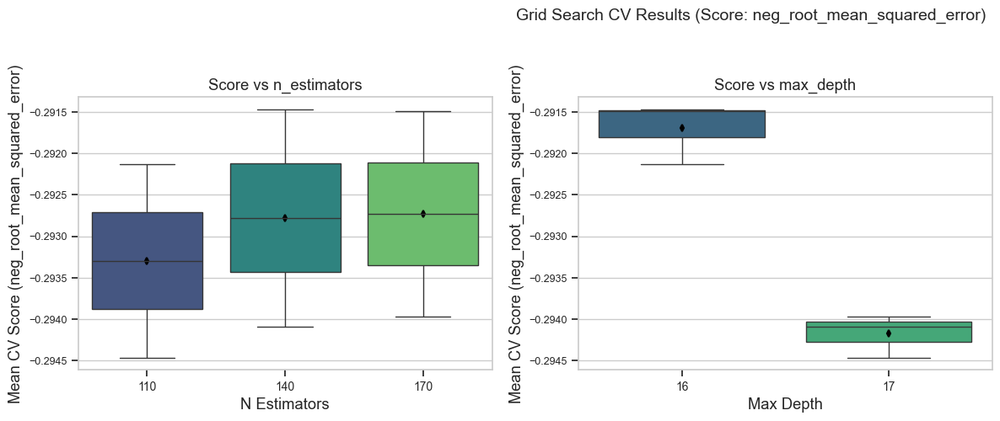


--- Saving Best Model/Pipeline ---
Best model/pipeline saved to: grid_tuned_rf_output_from_pipeline\grid_tuned_random_forest_model.joblib

--- Extracting Feature Importances (Tuned Model) ---

--- Extracting Feature Importances ---
  Using generic 'feature_importances_' attribute.
Feature importances saved to: grid_tuned_rf_output_from_pipeline\tuned_feature_importances.csv
Top 15 Features:
                         Feature/Component  Importance
0                                    %_Gas    0.468319
1                                  %_Steam    0.111302
2                             Age_Building    0.060013
3                         PropertyGFATotal    0.058616
4    supermarket/grocery store_Total_%_GFA    0.054790
5                       office_Total_%_GFA    0.051951
6   non-refrigerated warehouse_Total_%_GFA    0.036239
7                        other_Total_%_GFA    0.033541
8                           NumberofFloors    0.031571
9           other - recreation_Total_%_GFA    0.018735


In [230]:
param_grid_for_tuning = {
    'n_estimators': [110, 140, 170],      # Specific values to try for n_estimators
    'max_depth': [16, 17],            # Specific values to try for max_depth
    'min_samples_split': [2],     # Specific values
    'min_samples_leaf': [1],           # Specific values
    'max_features': [0.5],      
    'random_state': [42],}


grid_tuning_params = {
    'results_from_run_full_regression_pipeline': initial_pipeline_results_for_grid,
    'param_grid_config': param_grid_for_tuning, # Use the grid here
    'cv_folds': 5,
    'scoring_metric': 'neg_root_mean_squared_error', # Use the same or preferred scoring
    'random_state': 42,
    'results_dir': "grid_tuned_rf_output_from_pipeline", # Output directory for grid results
    'best_model_filename': "grid_tuned_random_forest_model.joblib",
    'save_importance': True,
    'top_n_features': 15}

grid_tuned_model, grid_tuned_test_scores = My_function_p4.orchestrate_grid_tuned_rf_on_pipeline_output(**grid_tuning_params)
if grid_tuned_model:
    print("\nSuccessfully performed Grid Search tuning.")
    print(f"Best grid-tuned model test scores: {grid_tuned_test_scores}")
else:
    print("\nGrid tuning process failed.")

# 5. Analyse finale

## RF model


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(1081, 38), y=(1081,)
Test set shape: X=(271, 38), y=(271,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (1081, 38)
Step 2: Preprocessing complete.

--- 3. Performing Recursive Feature Elimination (RFE) ---
Initial number of features for RFE: 38
Target number of features to select: 17 (45%)
  Using RandomForestRegressor with params {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1} as RFE estimator (random_state=42).
Fitting RFE to select 17 features...
RFE fitting complete.
RFE complete. Selected 17 features.
Step 3: RFE selection applied successfully.
  Final features selected: 17
  Final data shapes: X

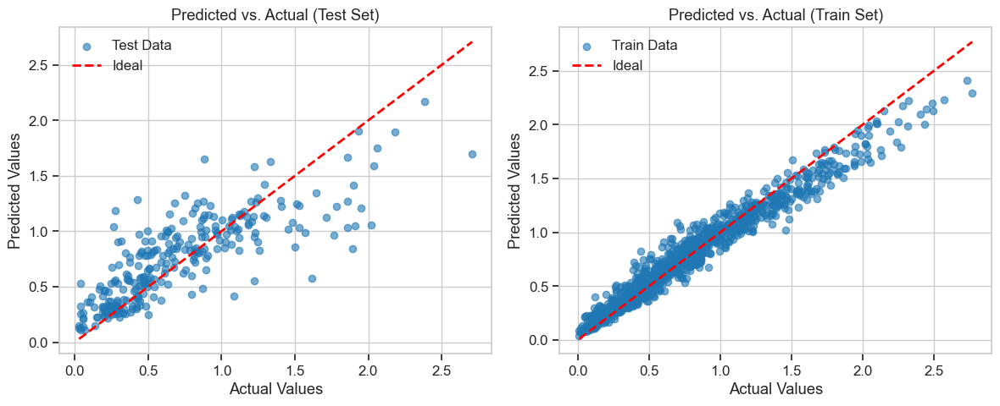

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 20 worst predictions ---
  Analyzing residuals based on 17 final features.
Residuals Summary: Min=-0.9047, Mean=-0.0399, Max=1.0498, Std=0.2987


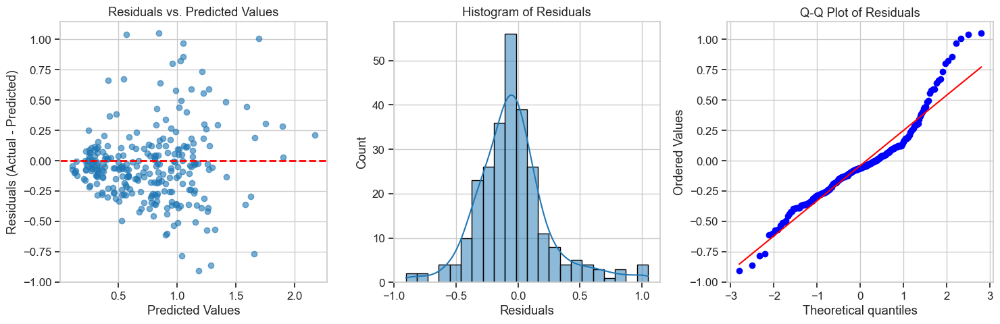


Detailing Top 20 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0            1283       1.893112          0.843317  1.049795           1.049795                   1.893112
1             628       1.615420          0.573265  1.042155           1.042155                   1.615420
2             426       2.706716          1.695978  1.010738           1.010738                   2.706716
3            1156       2.021548          1.054161  0.967387           0.967387                   2.021548
4            2411       0.277632          1.182304 -0.904673           0.904673                   0.277632
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 17 features used by the model.
Note: MDI Importance is for the features *after* pr

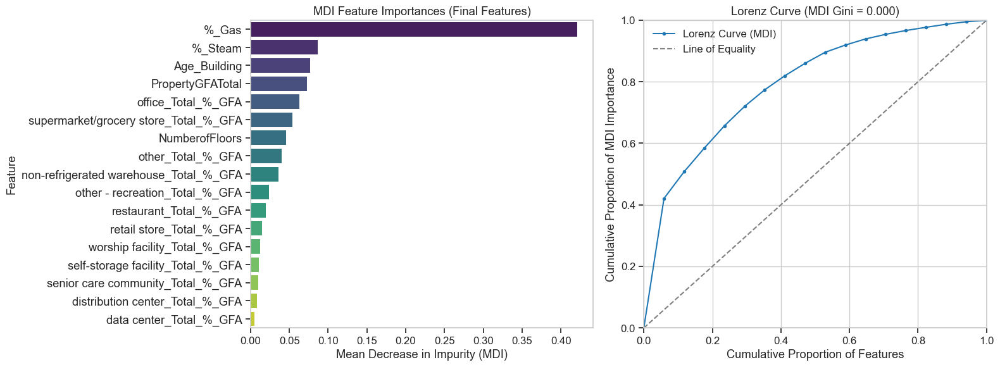

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 271 test samples and 17 features...
  SHAP Expected Value (Base): 0.7388

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                                 %_Gas       0.258829
                               %_Steam       0.052283
non-refrigerated warehouse_Total_%_GFA       0.048771
                    office_Total_%_GFA       0.039110
 supermarket/grocery store_Total_%_GFA       0.029113
                     other_Total_%_GFA       0.028828
                          Age_Building       0.019968
          worship facility_Total_%_GFA       0.016624
                        NumberofFloors       0.014404
       distribution center_Total_%_GFA       0.014013

Generating SHAP summary plots...


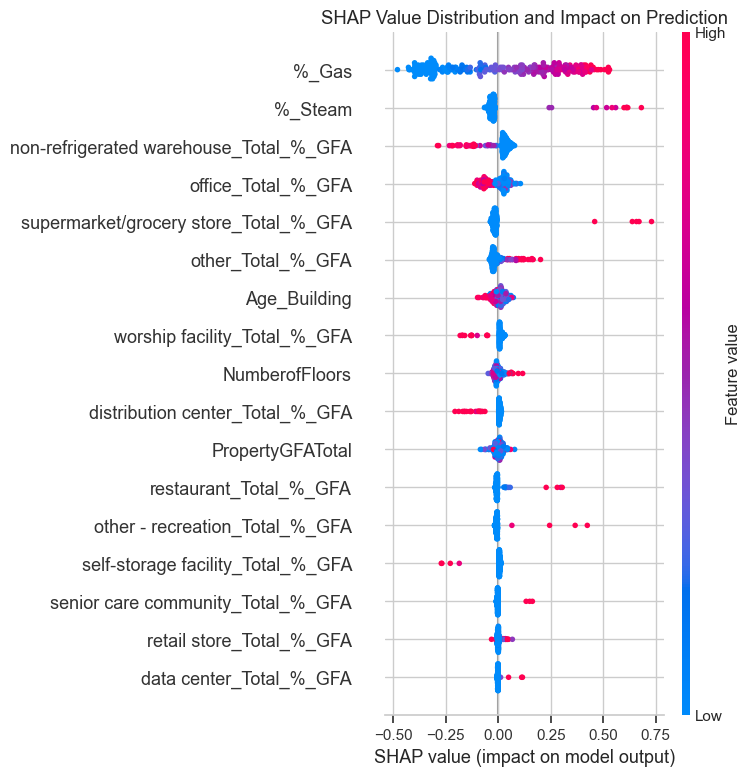


Generating SHAP dependence plots for top 5 features: ['%_Gas', '%_Steam', 'non-refrigerated warehouse_Total_%_GFA', 'office_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA']
  Could not generate dependence plot for '%_Gas': 'shap_values' must have the same number of columns as 'features'!
  Could not generate dependence plot for '%_Steam': 'shap_values' must have the same number of columns as 'features'!
  Could not generate dependence plot for 'non-refrigerated warehouse_Total_%_GFA': index 26 is out of bounds for axis 1 with size 17
  Could not generate dependence plot for 'office_Total_%_GFA': index 17 is out of bounds for axis 1 with size 17
  Could not generate dependence plot for 'supermarket/grocery store_Total_%_GFA': 'shap_values' must have the same number of columns as 'features'!
Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: df_Feng_analysis_results_scaled_with_None_pcaNone.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Info' sheet.
  - P

<Figure size 640x480 with 0 Axes>

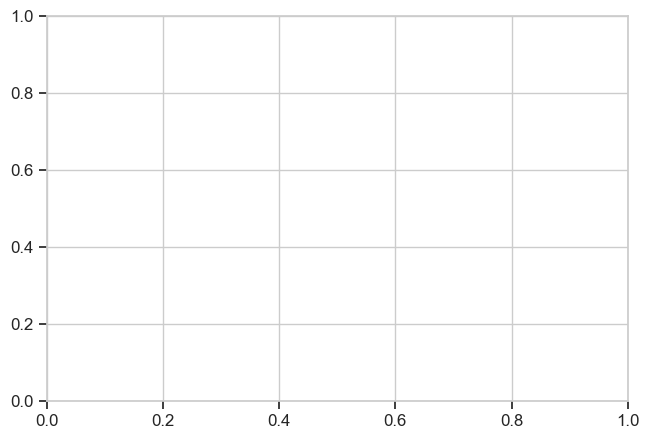

<Figure size 640x480 with 0 Axes>

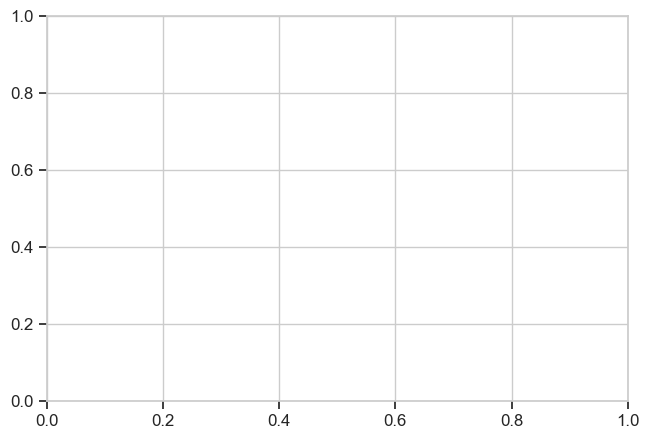

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

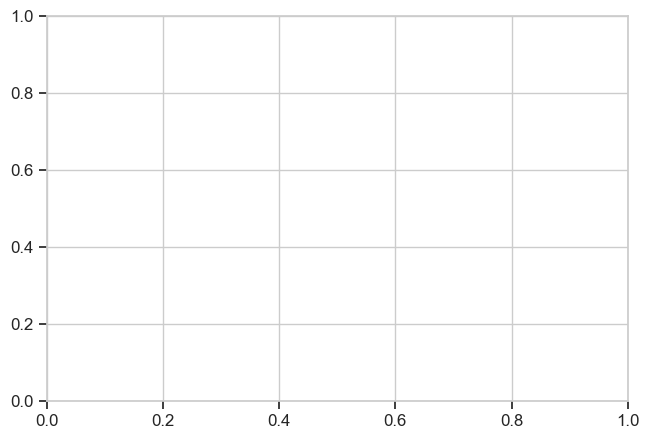

In [231]:
# Reload the module
importlib.reload(My_function_p4)
# --- Configuration for the Analysis ---
target_variable = "log_GHGEmissionsIntensity"
scaler_choice = 'None' # scaler_choice = 'standard', 'minmax', 'none'
pca_components = None #  number or None
rf_hyperparams = {
    'n_estimators': 140,      # Specific values to try for n_estimators
    'max_depth': 20,            # Specific values to try for max_depth
    'min_samples_split': 2,     # Specific values
    'min_samples_leaf': 1,           # Specific values
    'max_features': 'sqrt',      
    'random_state': 42}
output_file = f"df_Feng_analysis_results_scaled_with_{scaler_choice}_pca{pca_components if pca_components else 'None'}.xlsx"


# --- Run the Analysis ---
analysis_results = My_function_p4.run_full_regression_pipeline(df=df_summed_log, target_col=target_variable,scaler_type=scaler_choice,
                                                pca_n_comp=pca_components,test_size=0.2,random_state=42,target_feature_ratio=0.45,
                                                n_worst_residuals=20, rf_params=rf_hyperparams, output_filename=output_file)

In [232]:
df_summed_log[["log_GHGEmissionsIntensity"]].describe()

,log_GHGEmissionsIntensity
count,1352.000000
mean,0.734394
std,0.528420
min,0.009950
25%,0.300105
50%,0.609766
75%,1.058657
max,2.768832


Performance : 
- 2 résidus au-delà de 1 en valeur absolue
- Même si la valeur du train est élevé, la CV nous évite l'overfit
- Le modèle n'est pas précis, mais moins grossier que pour l'autre cible. 
- 0.6268 à l'overview, les améliorations data et models centric ont moté de 1,3centième le R2.
- Une MAE de 21,5 centièmes correspond à presque 100% d'erreur sur la tranche faible vers Q1 ; 20% sur la tranche haute vers Q3

A noter : ces valeurs correspondent au log de la cible. 


Contenu :
- Même en modèle réduit par RFE, l'importance des features est très déséquilibrée.
- la feature la plus importante est de 42%, la seconde 9% puis 7,4%
- la taille du modèle est moins de la moitié de celui de départ.

# 6 Comparaison : Energystarscore 

## RF regressor

## Intro

Pour avoir une meilleure explicabilité dans l'importance des features, on prend un df sans ACP. df_summed à ce niveau a les meilleurs résultats.

On prend df_summed car parmis les df complet : c'est sur celui-ci que les performances sont les meilleures.


Ajouter le df_summed + AVEC la colonne energystarscore.

Faire une optim rapide et manuelle, l'important est d' avoir l'analyse du modèle pour la comparer avec l'analyse sans l'energystar du chapitre 2. Surtout les features importances et les perfs globales.

Le dataframe :

In [233]:
import pickle
with open("df_summed_compare_energy.pkl", "rb") as f:
    df_summed_compare_energy = pickle.load(f)

In [234]:
import pickle
with open("df_summed_energy.pkl", "rb") as f:
    df_summed_energy = pickle.load(f)

In [235]:
cor_col_summed = ["%_GFA_Parking", "%_Elec","PropertyGFAParking", "PropertyGFABuilding(s)",
           "%_GFA_Largest_Use", "%_GFA_SecondLargest_Use", "%_GFA_ThirdLargest_Use", "%_GFA_Building"]
drop_col_summed = target_col + cor_col_summed
df_summed_energy = df_summed_energy.drop(columns=drop_col_summed)

In [236]:
cor_col_summed = ["%_GFA_Parking", "%_Elec","PropertyGFAParking", "PropertyGFABuilding(s)",
           "%_GFA_Largest_Use", "%_GFA_SecondLargest_Use", "%_GFA_ThirdLargest_Use", "%_GFA_Building"]
drop_col_summed = target_col + cor_col_summed
df_summed_compare_energy = df_summed_compare_energy.drop(columns=drop_col_summed)

In [237]:
num_col, cat_col = type_definition(df_summed_compare_energy)
df_summed_compare_energy = df_summed_compare_energy[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', '%_Steam', '%_Gas', 'log_SiteEUIWN(kBtu/sf)', 'log_GHGEmissionsIntensity', 'hotel_Total_%_GFA', 'other_Total_%_GFA', 'other - services_Total_%_GFA', 'parking_Total_%_GFA', 'data center_Total_%_GFA', 'college/university_Total_%_GFA', 'retail store_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA', 'restaurant_Total_%_GFA', 'refrigerated warehouse_Total_%_GFA', 'other - recreation_Total_%_GFA', 'office_Total_%_GFA', 'other - entertainment/public assembly_Total_%_GFA', 'Aucun_Total_%_GFA', 'senior care community_Total_%_GFA', 'medical office_Total_%_GFA', 'k-12 school_Total_%_GFA', 'worship facility_Total_%_GFA', 'self-storage facility_Total_%_GFA', 'multifamily housing_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'social/meeting hall_Total_%_GFA', 'residence hall/dormitory_Total_%_GFA', 'fitness center/health club/gym_Total_%_GFA', 'distribution center_Total_%_GFA', 'CouncilDi

In [238]:
num_col, cat_col = type_definition(df_summed_energy)
df_summed_energy = df_summed_energy[num_col]

Colonnes numériques : ['Age_Building', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', '%_Steam', '%_Gas', 'log_SiteEUIWN(kBtu/sf)', 'log_GHGEmissionsIntensity', 'hotel_Total_%_GFA', 'other_Total_%_GFA', 'other - services_Total_%_GFA', 'parking_Total_%_GFA', 'data center_Total_%_GFA', 'college/university_Total_%_GFA', 'retail store_Total_%_GFA', 'supermarket/grocery store_Total_%_GFA', 'restaurant_Total_%_GFA', 'refrigerated warehouse_Total_%_GFA', 'other - recreation_Total_%_GFA', 'office_Total_%_GFA', 'other - entertainment/public assembly_Total_%_GFA', 'Aucun_Total_%_GFA', 'senior care community_Total_%_GFA', 'medical office_Total_%_GFA', 'k-12 school_Total_%_GFA', 'worship facility_Total_%_GFA', 'self-storage facility_Total_%_GFA', 'multifamily housing_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'social/meeting hall_Total_%_GFA', 'residence hall/dormitory_Total_%_GFA', 'fitness center/health club/gym_Total_%_GFA', 'distribution center_Total_%_GFA', 'CouncilDi

## Analyse

### Sans l'energy score

La fonction d'analyse :

In [239]:
df_summed_compare_energy = df_summed_compare_energy.drop(columns="log_SiteEUIWN(kBtu/sf)")


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 38, Using 38 numeric features.
Train set shape: X=(710, 38), y=(710,)
Test set shape: X=(178, 38), y=(178,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (710, 38)
Step 2: Preprocessing complete.
Step 3: RFE skipped (target_feature_ratio not in (0, 1) or <= 1 feature).

--- 4. Training Final RandomForestRegressor Model ---
  Using RandomForestRegressor with params: {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': 42}
Training with 710 samples and 38 features.


Model training complete.
Step 4: Final model training complete.

--- 5. Evaluating Regressor Performance ---
  Evaluating on 38 final features.
Scores on train set:
  R²   : 0.9244
  MAE  : 0.0994
  MSE  : 0.0177
  RMSE : 0.1332

Scores on test set:
  R²   : 0.7370
  MAE  : 0.1773
  MSE  : 0.0693
  RMSE : 0.2633


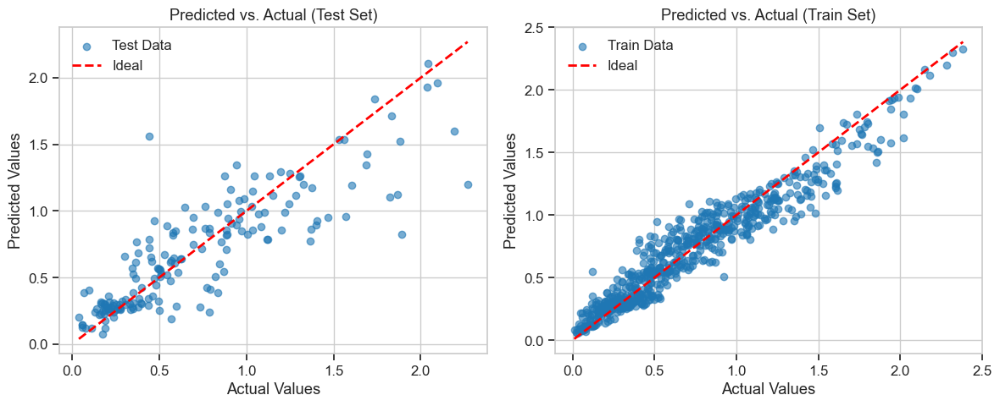

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 20 worst predictions ---
  Analyzing residuals based on 38 final features.
Residuals Summary: Min=-1.1160, Mean=0.0277, Max=1.0721, Std=0.2626


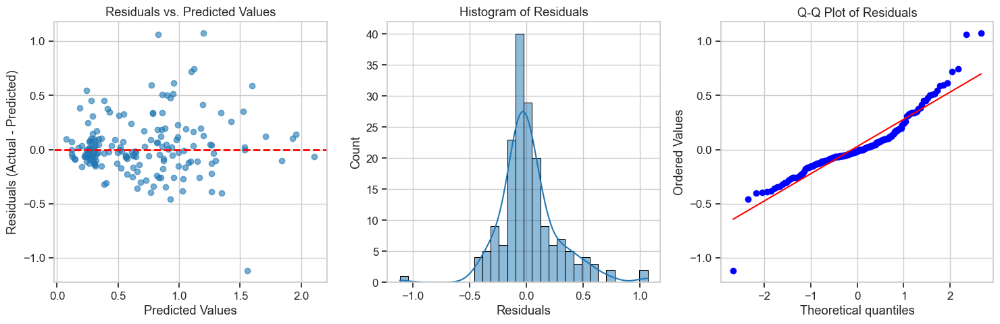


Detailing Top 20 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0             571       0.444686          1.560659 -1.115973           1.115973                   0.444686
1             116       2.269028          1.196886  1.072142           1.072142                   2.269028
2             731       1.893112          0.827588  1.065524           1.065524                   1.893112
3            1241       1.867176          1.123415  0.743761           0.743761                   1.867176
4             882       1.822935          1.101587  0.721348           0.721348                   1.822935
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 38 features used by the model.
Note: MDI Importance is for the features *after* pr

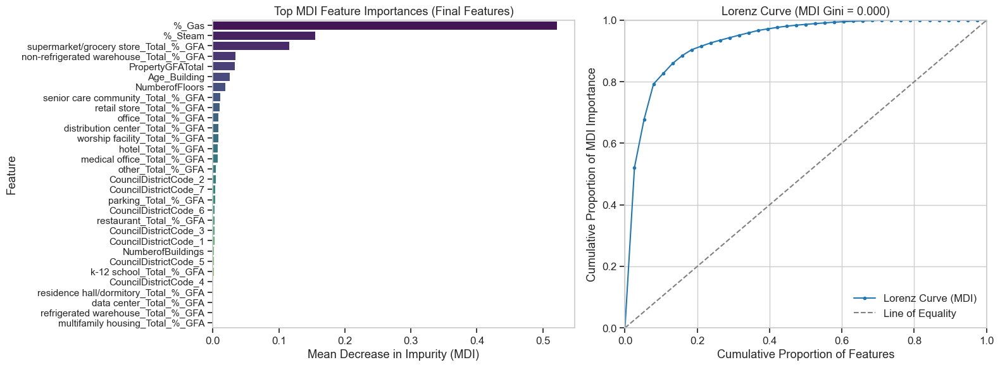

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 178 test samples and 38 features...
  SHAP Expected Value (Base): 0.6757

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                                 %_Gas       0.299218
                               %_Steam       0.070785
 supermarket/grocery store_Total_%_GFA       0.051781
non-refrigerated warehouse_Total_%_GFA       0.042547
                          Age_Building       0.013145
                        NumberofFloors       0.013111
          worship facility_Total_%_GFA       0.011785
                      PropertyGFATotal       0.011364
     senior care community_Total_%_GFA       0.009421
                    office_Total_%_GFA       0.008246

Generating SHAP summary plots...


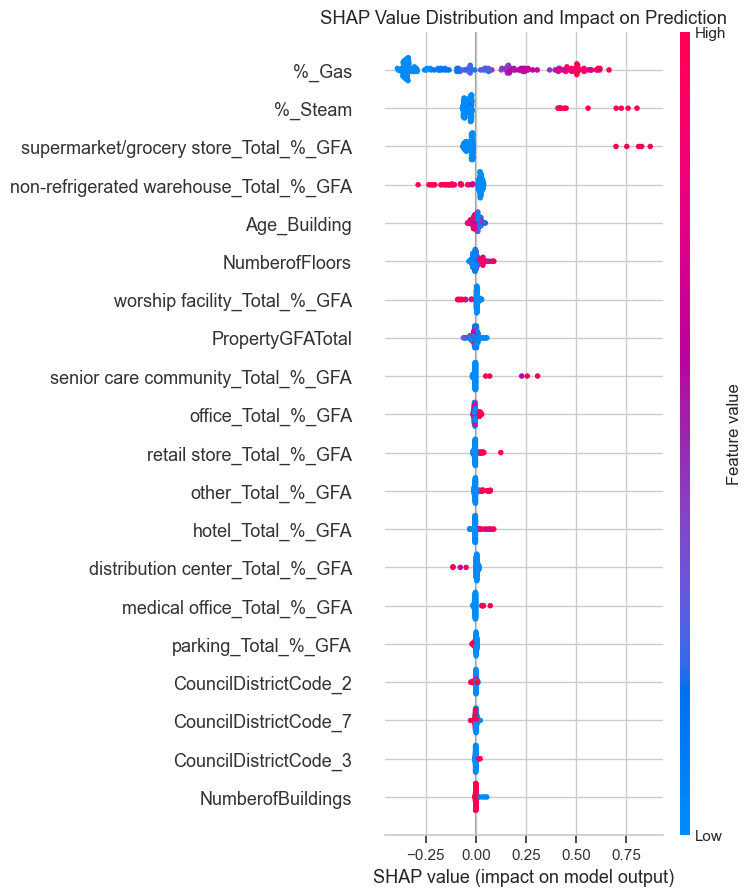


Generating SHAP dependence plots for top 5 features: ['%_Gas', '%_Steam', 'supermarket/grocery store_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA', 'Age_Building']


<Figure size 640x480 with 0 Axes>

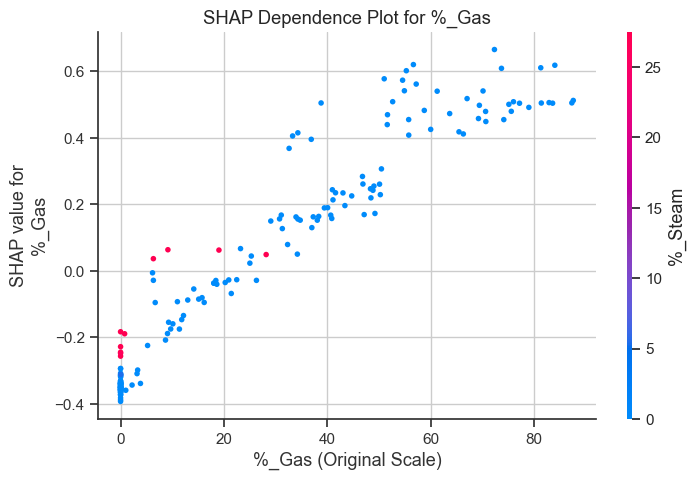

<Figure size 640x480 with 0 Axes>

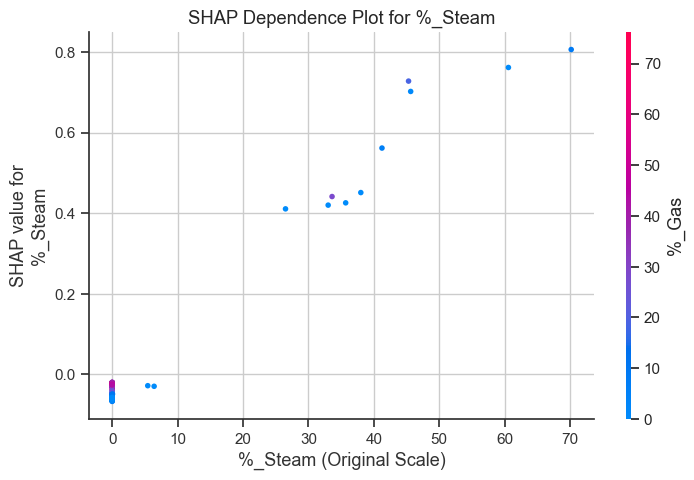

<Figure size 640x480 with 0 Axes>

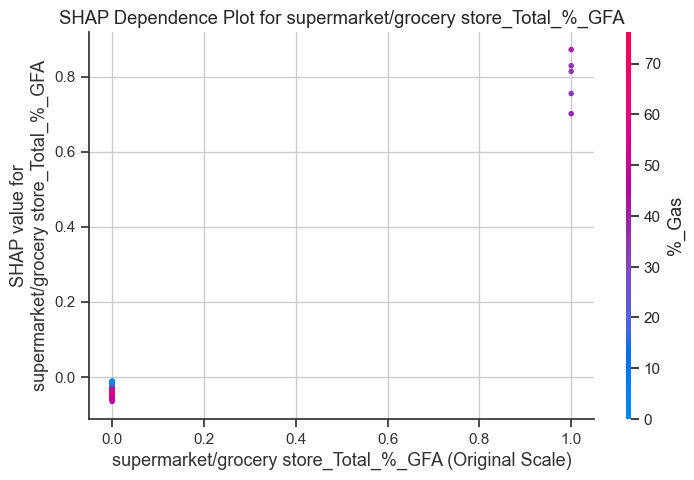

<Figure size 640x480 with 0 Axes>

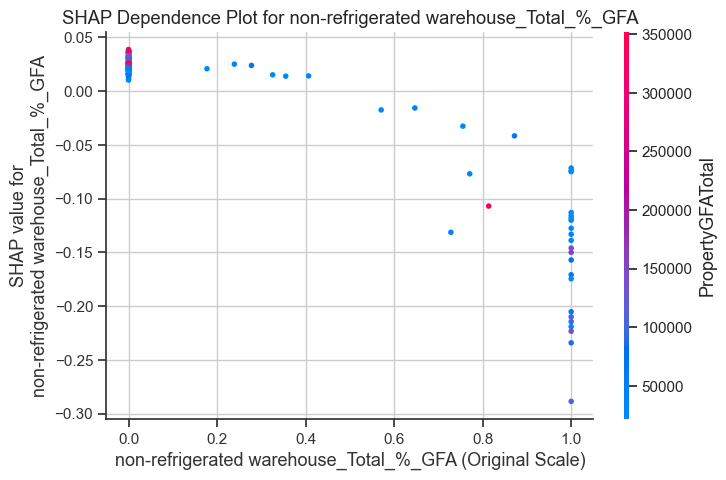

<Figure size 640x480 with 0 Axes>

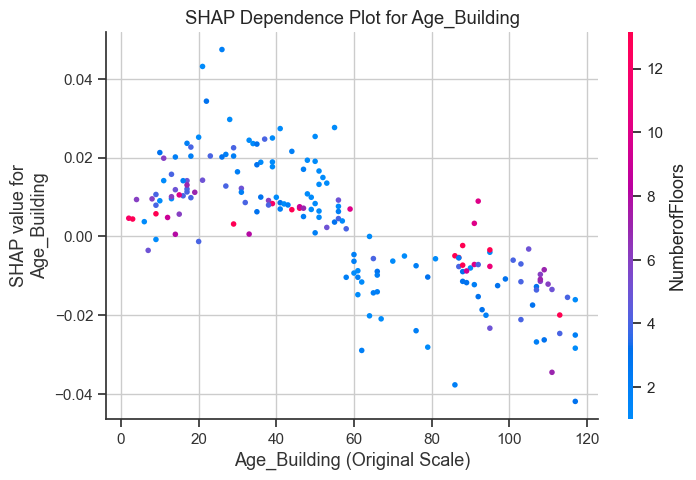

Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: df_summed_energy_compare_rf_regression_analysis_results.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Info' sheet.
  - Preparing 'Metrics' sheet.
  - Saved 'Metrics' sheet.
  - 'importance_df' not found, empty, or not a DataFrame in results, skipping sheet.
  - Preparing 'SHAP Importance Summary' sheet.
  - Saved 'SHAP Importance Summary' sheet.
  - Preparing 'SHAP Values (Test Set)' sheet.
  - Saved 'SHAP Values (Test Set)' sheet.
  - Preparing 'Worst Residuals' sheet.
  - Saved 'Worst Residuals' sheet.
Successfully saved results to df_summed_energy_compare_rf_regression_analysis_results.xlsx
Step 9: Results export attempt complete.

--- Full Regression Pipeline Finished in 4.10 seconds ---

--- Final Test Set Performance ---
  R²   : 0.7370
  MAE  : 0.1773
  MSE  : 0.0693
  RMSE : 0.2633


In [240]:
import importlib
import My_function_p4
importlib.reload(My_function_p4)

# Configuration
TARGET_COLUMN = "log_GHGEmissionsIntensity"
RANDOM_STATE = 42
N_WORST_RESIDUALS = 20
OUTPUT_FILE = 'df_summed_energy_compare_rf_regression_analysis_results.xlsx'

# Preprocessing Parameters
SCALER_TYPE = 'None' # Options: 'Standard', 'Robust', 'MinMax', 'None'
PCA_N_COMPONENTS = None # Options: None, an integer (e.g., 10), or a float between 0 and 1 (e.g., 0.95)

# RFE Parameter
FEATURE_RATIO_TO_KEEP = 1 # Keep % of features *after preprocessing* via RFE

# RandomForest hyperparameters for the FINAL model
RF_PARAMS = {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': RANDOM_STATE}

# Call the main function
analysis_results = My_function_p4.run_full_regression_pipeline(
     df=df_summed_compare_energy,
     target_col=TARGET_COLUMN,
     scaler_type=SCALER_TYPE,
     pca_n_comp=PCA_N_COMPONENTS,
     test_size=TEST_SIZE,
     random_state=RANDOM_STATE,
     target_feature_ratio=FEATURE_RATIO_TO_KEEP,
     n_worst_residuals=N_WORST_RESIDUALS,
     rf_params=RF_PARAMS,
     output_filename=OUTPUT_FILE
 )

Premièrement, comme pour l'autre target, ce jeu de données est de bien meilleure qualité que le précédent. Le modèle est meilleur avant même de l'améliorer. Il semble que le manque du score energétique est une indication de la qualité de la donnée en général.

### Avec l'energy score

La fonction d'analyse :

In [241]:
df_summed_energy = df_summed_energy.drop(columns="log_SiteEUIWN(kBtu/sf)") 


--- Starting Full Regression Pipeline ---
Random State used throughout pipeline: 42
--- 1. Preparing & Splitting Data (Target: 'log_GHGEmissionsIntensity') ---
Initial total features: 39, Using 39 numeric features.
Train set shape: X=(666, 39), y=(666,)
Test set shape: X=(222, 39), y=(222,)
Step 1: Data preparation and splitting complete.

--- 2. Applying Preprocessing (Scaling & PCA) ---
  No scaling applied.
  No PCA applied.
Preprocessing complete. Final feature shape before RFE: (666, 39)
Step 2: Preprocessing complete.
Step 3: RFE skipped (target_feature_ratio not in (0, 1) or <= 1 feature).

--- 4. Training Final RandomForestRegressor Model ---
  Using RandomForestRegressor with params: {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': 42}
Training with 666 samples and 39 features.
Model training complete.
Step 4: Final model training complete.

--- 5. Evaluating Regressor Performance ---
  Evaluating on 39 final features.
Scores on train set:
  R²   : 0.9599


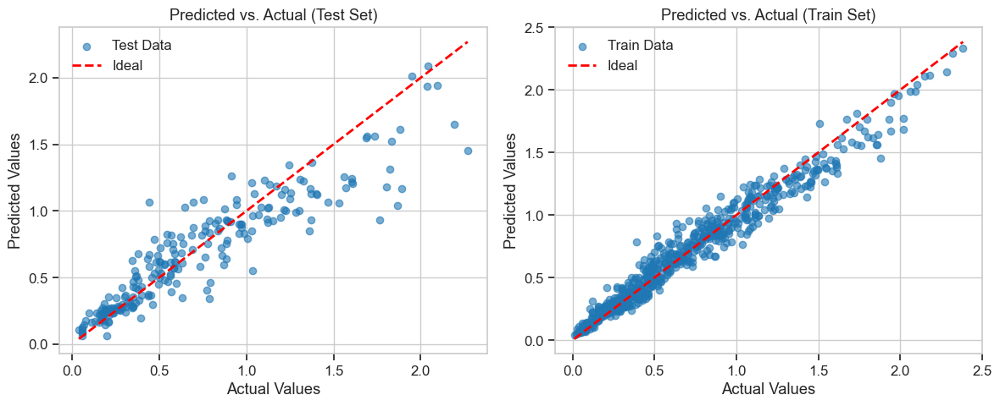

Step 5: Performance evaluation complete.

--- 6. Analyzing Regression Residuals (Test Set) for top 20 worst predictions ---
  Analyzing residuals based on 39 final features.
Residuals Summary: Min=-0.6189, Mean=0.0374, Max=0.8336, Std=0.2068


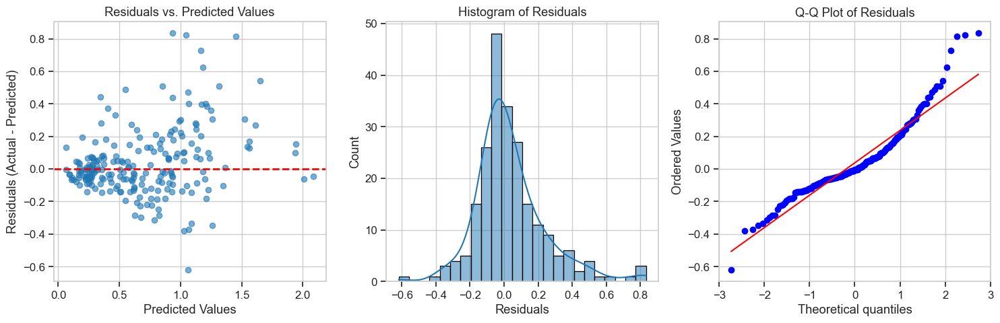


Detailing Top 20 Worst Predictions (by Absolute Residual):
Showing head of worst residuals dataframe (Prediction Info & Original Features):
   Original_Index  Actual_Target  Predicted_Target  Residual  Absolute_Residual  log_GHGEmissionsIntensity
0             262       1.766442          0.932867  0.833574           0.833574                   1.766442
1            1241       1.867176          1.042319  0.824857           0.824857                   1.867176
2             116       2.269028          1.453330  0.815699           0.815699                   2.269028
3             731       1.893112          1.165836  0.727276           0.727276                   1.893112
4            1142       1.805005          1.180230  0.624775           0.624775                   1.805005
Step 6: Residual analysis complete.

--- 7. Analyzing MDI Feature Importance (Mean Impurity Decrease) ---
Analyzing MDI importance for 39 features used by the model.
Note: MDI Importance is for the features *after* pr

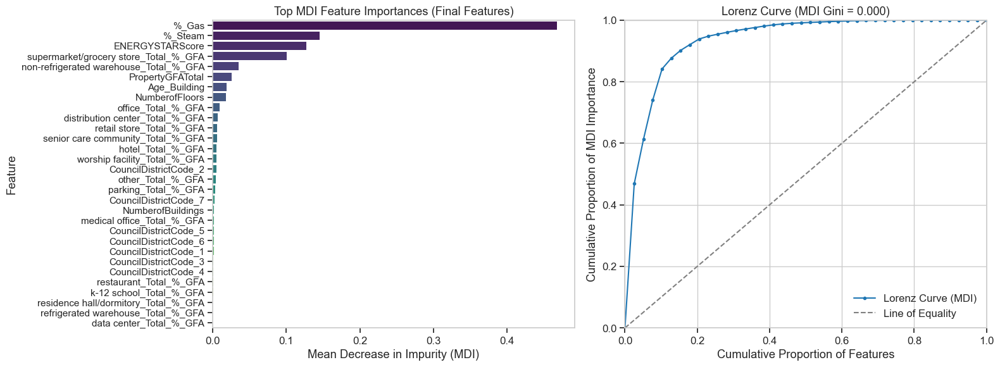

Step 7: MDI Feature importance analysis complete.

--- 8. Analyzing SHAP Values (Test Set) ---
Calculating SHAP values for 222 test samples and 39 features...
  SHAP Expected Value (Base): 0.6692

SHAP Feature Importance Summary (Top 10 or all):
                               Feature  Mean_Abs_SHAP
                                 %_Gas       0.290347
                       ENERGYSTARScore       0.115438
                               %_Steam       0.068858
 supermarket/grocery store_Total_%_GFA       0.045335
non-refrigerated warehouse_Total_%_GFA       0.043958
                        NumberofFloors       0.017914
                      PropertyGFATotal       0.012340
                    office_Total_%_GFA       0.010210
          worship facility_Total_%_GFA       0.007147
       distribution center_Total_%_GFA       0.005442

Generating SHAP summary plots...


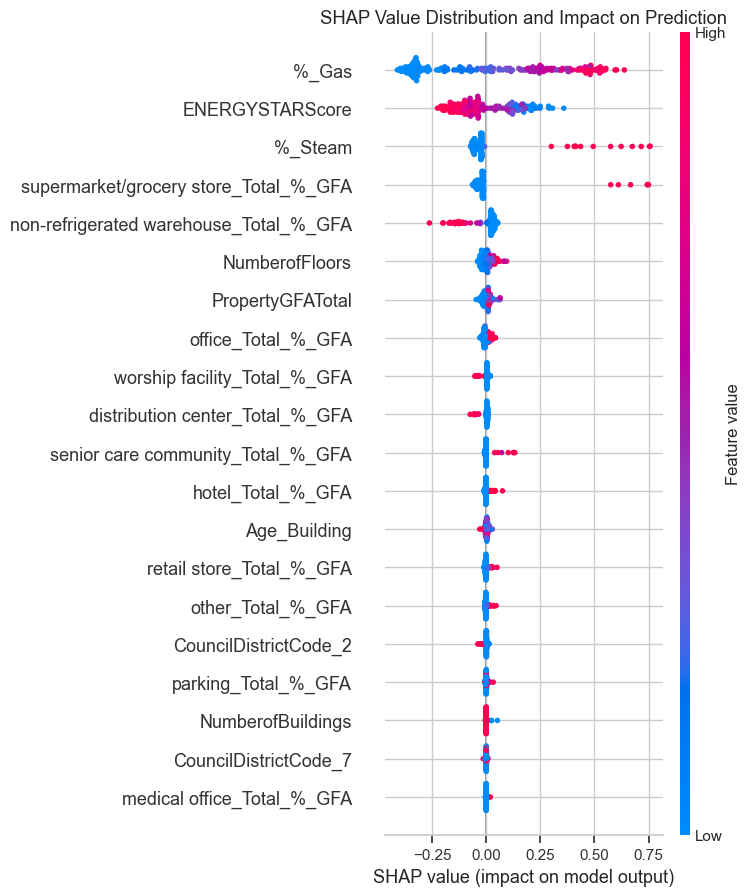


Generating SHAP dependence plots for top 5 features: ['%_Gas', 'ENERGYSTARScore', '%_Steam', 'supermarket/grocery store_Total_%_GFA', 'non-refrigerated warehouse_Total_%_GFA']


<Figure size 640x480 with 0 Axes>

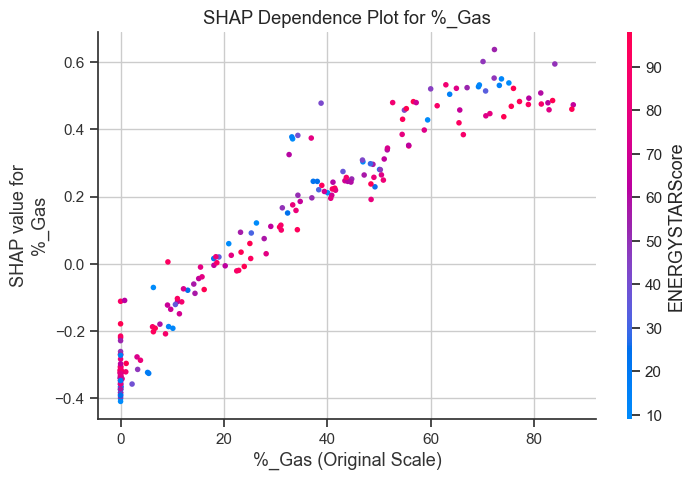

<Figure size 640x480 with 0 Axes>

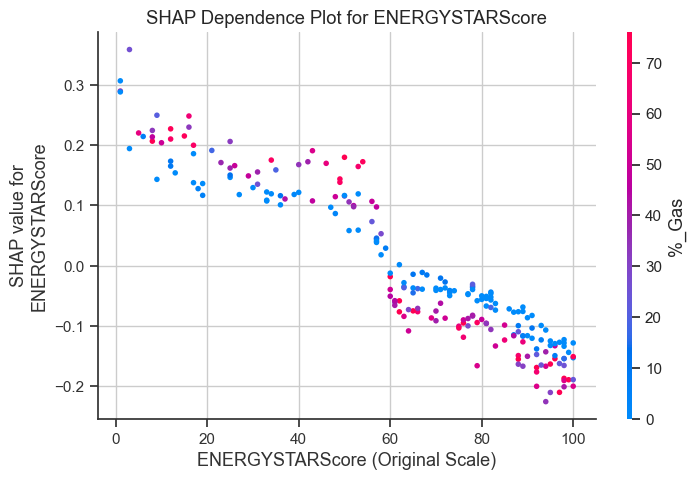

<Figure size 640x480 with 0 Axes>

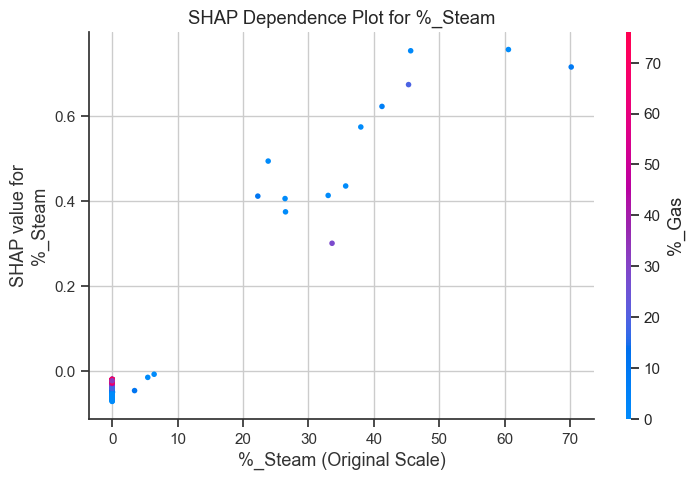

<Figure size 640x480 with 0 Axes>

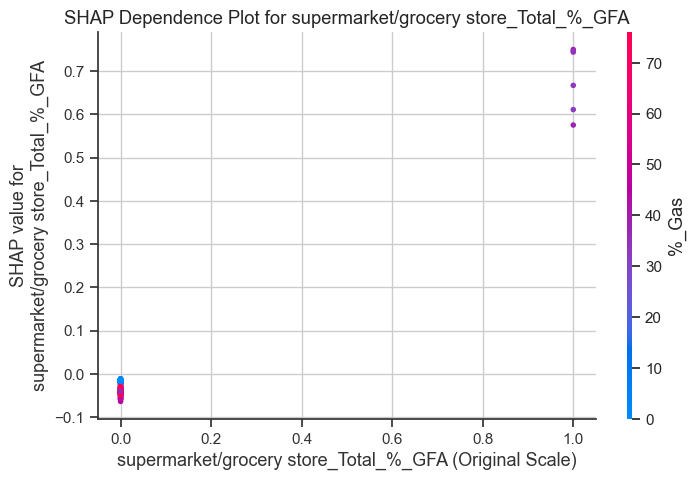

<Figure size 640x480 with 0 Axes>

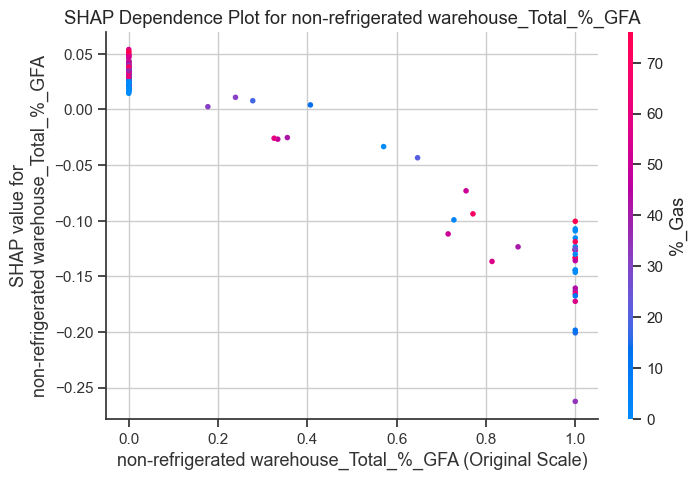

Step 8: SHAP analysis complete.

--- 9. Exporting Results to Excel: df_summed_energy_rf_regression_analysis_results.xlsx ---
  - Preparing 'Run Info' sheet.
  - Saved 'Run Info' sheet.
  - Preparing 'Metrics' sheet.
  - Saved 'Metrics' sheet.
  - 'importance_df' not found, empty, or not a DataFrame in results, skipping sheet.
  - Preparing 'SHAP Importance Summary' sheet.
  - Saved 'SHAP Importance Summary' sheet.
  - Preparing 'SHAP Values (Test Set)' sheet.
  - Saved 'SHAP Values (Test Set)' sheet.
  - Preparing 'Worst Residuals' sheet.
  - Saved 'Worst Residuals' sheet.
Successfully saved results to df_summed_energy_rf_regression_analysis_results.xlsx
Step 9: Results export attempt complete.

--- Full Regression Pipeline Finished in 4.80 seconds ---

--- Final Test Set Performance ---
  R²   : 0.8320
  MAE  : 0.1432
  MSE  : 0.0440
  RMSE : 0.2097


In [242]:
import importlib
import My_function_p4
importlib.reload(My_function_p4)

# Configuration
TARGET_COLUMN = "log_GHGEmissionsIntensity"
TEST_SIZE = 0.25
RANDOM_STATE = 42
N_WORST_RESIDUALS = 20
OUTPUT_FILE = 'df_summed_energy_rf_regression_analysis_results.xlsx'

# Preprocessing Parameters
SCALER_TYPE = 'None' # Options: 'Standard', 'Robust', 'MinMax', 'None'
PCA_N_COMPONENTS = None # Options: None, an integer (e.g., 10), or a float between 0 and 1 (e.g., 0.95)

# RFE Parameter
FEATURE_RATIO_TO_KEEP = 1 # Keep % of features *after preprocessing* via RFE

# RandomForest hyperparameters for the FINAL model
RF_PARAMS = {'n_estimators': 150, 'max_depth': 10, 'n_jobs': -1, 'random_state': RANDOM_STATE}

# Call the main function
analysis_results = My_function_p4.run_full_regression_pipeline(
     df=df_summed_energy,
     target_col=TARGET_COLUMN,
     scaler_type=SCALER_TYPE,
     pca_n_comp=PCA_N_COMPONENTS,
     test_size=TEST_SIZE,
     random_state=RANDOM_STATE,
     target_feature_ratio=FEATURE_RATIO_TO_KEEP,
     n_worst_residuals=N_WORST_RESIDUALS,
     rf_params=RF_PARAMS,
     output_filename=OUTPUT_FILE
 )

# Conclusion T2

Le modèle était déjà meilleur sans l'energystarscore, avant même de l'améliorer.

Ensuite, ajouter le score d'énergie améliore encore la qualité des prédictions. Cependant, son influence n'est pas aussi significative que pour la prédiction de la première target.

Vu la différence, nous allons construire un modèle avec et sans l'énergie. Si cette information est toujours aussi disponible, le modèle avec l'energystarscore peut être utilisé. 
Si nous n'avons pas cette information, ou plus dans le futur, ou pas suffisament : on peut utiliser le modèle "réduit" utilisé pour comparer.

# Pour aller plus loin T2

- <b> <u> Optimisation - comparaison du modèle  </u> : </b>

Passer les prédictions à l'exponentielle et recalculer les métriques du modèles pour l'optimiser. Ensuite, comparer les performances avec un modèle entrainé sur la cible non passée au log (et construire le modèle avec la cible non passé au log en //)